# prep

### imports

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.optim.lr_scheduler import StepLR, ExponentialLR

import geoopt
from geoopt.optim import RiemannianAdam

### utils

In [6]:
def load_data(version='ml-100k'):
    import os, requests, zipfile
    link = f'https://files.grouplens.org/datasets/movielens/{version}.zip'
    if not os.path.exists(version):
        with open('data.zip', 'wb') as f:
            f.write(requests.get(link, stream=True).content)
        zipfile.ZipFile('data.zip', 'r').extractall()
        os.remove('data.zip')

    if version == 'ml-1m':
        data = pd.read_csv(f'{version}/ratings.dat', delimiter='::', header=None, names=['user_id', 'item_id', 'rating', 'timestamp'], engine='python')
        #items, users = None, None
    elif version == 'ml-100k':
        data = pd.read_csv(f'{version}/u.data', sep='\t', header=None, names=['user_id', 'item_id', 'rating', 'timestamp'])
        # genres = pd.read_csv(f'{version}/u.genre', sep='|', header=None, encoding='latin-1').iloc[:, 0].to_list()
        # items = pd.read_csv(f'{version}/u.item', sep='|', header=None, encoding='latin-1')
        # items.columns = ['item_id', 'title', 'release_date', 'empty', 'link'] + genres
        # items = items.drop(['empty', 'release_date', 'link'], axis=1)
        # items['item_id'] = items['item_id'] - 1
        # users = pd.read_csv(f'{version}/u.user', sep='|', header=None, encoding='latin-1', names='user_id,age,gender,occupation,zip_code'.split(','))
        # users['user_id'] = users['user_id'] - 1

    data['user_id'] = np.unique(data['user_id'], return_inverse=True)[1]
    data['item_id'] = np.unique(data['item_id'], return_inverse=True)[1]
    data = data.sort_values(['user_id', 'timestamp']).reset_index(drop=True)
    return data#, items, users

def train_test_split_single(data, how='last', seed=1):
    cols = ['user_id', 'item_id']
    if how == 'last':
        data_test = data.groupby('user_id').nth(-1).reset_index() # last item as test set
        data_valid = data.groupby('user_id').nth(-2).reset_index() # 2nd last item as valid set
        data_train = pd.concat([data, data_test, data_valid]).drop_duplicates(keep=False).reset_index(drop=True)
        return data_train[cols], data_valid[cols], data_test[cols]
    elif how == 'random':
        data_test = data.groupby('user_id').sample(random_state=seed).reset_index()[cols]
        data_train = pd.concat([data, data_test]).drop_duplicates(keep=False).reset_index()[cols]
        data_valid = data_train.groupby('user_id').sample(random_state=seed).reset_index()[cols]
        data_train = pd.concat([data_train, data_valid]).drop_duplicates(keep=False).reset_index()[cols]
        return data_train[cols], data_valid[cols], data_test[cols]

def select_by_index(input, index):
    out = torch.zeros_like(index)
    for i in range(input.shape[0]):
        out[i] = input[i, index[i]]
    return out

def isin_batch(elements, test_elements):
    out = torch.zeros_like(elements)
    for i in range(elements.shape[0]):
        out[i] = torch.isin(elements[i], test_elements[i]).item()
    return out.bool()

def hit_rate(pos_items, items, item_dist, k=10):
    topk_dist = item_dist.topk(k=k, dim=1, largest=False)
    topk = select_by_index(items, topk_dist.indices)
    return isin_batch(pos_items, topk).sum().item(), pos_items.shape[0]

def ndcg(pos_items, items, item_dist, k=10):
    topk_dist = item_dist.topk(k=k, dim=1, largest=False)
    topk = select_by_index(items, topk_dist.indices)
    _, indices = (topk == pos_items).nonzero(as_tuple=True)
    dcg = (1/torch.log2(indices+2))
    #idcg = (1/torch.log2(torch.arange(0,k)+2)).sum()
    return dcg.sum().item(), pos_items.shape[0]

def full_hit_rate(trainer, data_train):
    lists = trainer.predict_lists().numpy().argsort()
    hits = 0
    for i in range(N_USERS):
        user, item, _ = valid_set[i]
        user, item = user.item(), item.item()
        positives = data_train.loc[data_train.user_id == user].item_id.to_numpy()
        candidates = lists[i][~np.isin(lists[i], positives)]
        hits += (item in candidates[:10])
    return hits/N_USERS

class dotdict(dict):
    """dot.notation access to dictionary attributes"""
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

### data & constants

In [4]:
DATA = 'samokat'
SIZE = '100k'

In [5]:
if DATA == 'movielens':
    data = load_data(f'ml-{SIZE}')
    data_train, data_valid, data_test = train_test_split_single(data, how='last')
elif DATA == 'samokat':
    data = pd.read_csv(f'data_{SIZE}.csv')
    data_train, data_valid, data_test = train_test_split_single(data, how='random')

In [6]:
# data_test = data.groupby('user_id').nth(-1).reset_index() # last item as test set
# data_valid = data.groupby('user_id').nth(-2).reset_index() # 2nd last item as valid set
# data_train = pd.concat([data, data_test, data_valid]).drop_duplicates(keep=False).reset_index(drop=True)

In [7]:
# data_train, data_valid, data_test = train_test_split_single(data, how)

In [6]:
N_USERS = data.user_id.nunique()
N_ITEMS = data.item_id.nunique()

In [7]:
user_sizes = data.groupby('user_id').count().item_id.to_numpy()
item_sizes = data.groupby('item_id').count().user_id.to_numpy()

## classes

### dataset

In [8]:
class PariwiseDataset(Dataset):
    def __init__(self, data, n_users, n_items, neg_samples=1, weights=None, seed=None):
        self.data = data
        self.n_users = n_users
        self.n_items = n_items
        self.neg_samples = neg_samples
        self.weights = weights
        self.random_gen = np.random.default_rng(seed=seed)

    def __len__(self):
        return self.data.shape[0]

    def __getitem__(self, idx):
        user = self.data.loc[idx, 'user_id']
        item_pos = self.data.loc[idx, 'item_id']

        # negative mining
        rated_items = self.data.loc[self.data['user_id'] == user, 'item_id']
        possible_neg = np.setdiff1d(np.arange(self.n_items), rated_items)
        if self.weights is not None:
            weights = self.weights[possible_neg] / self.weights[possible_neg].sum()
        else:
            weights = None
        item_neg = self.random_gen.choice(
            possible_neg, 
            size=self.neg_samples, 
            replace=False, 
            p=weights)
        
        # if self.neg_samples > 1:
        sample = [
            torch.tensor([user]), 
            torch.tensor([item_pos]), 
            torch.tensor(item_neg)
        ]
        # else:
        #     sample = [
        #         torch.tensor(user), 
        #         torch.tensor(item_pos), 
        #         torch.tensor(item_neg[0])
        #     ]
        return sample

### trainer

In [9]:
class MetricTrainer(nn.Module):
    def __init__(self, model, criterion, regulariser=None):
        super().__init__()
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = model.to(self.device)
        self.criterion = criterion
        self.regulariser = regulariser
        self.optimizer = None
        self.scheduler = None
        self.logs = {}

    def forward(self, users, items):
        return self.model.forward(users, items)
    
    def log(self, name, value):
        if name not in self.logs:
            self.logs[name] = np.array([])
        if isinstance(value, (float, int)):
            self.logs[name] = np.append(self.logs[name], value)
        elif isinstance(value, np.ndarray):
            self.logs[name] = np.concatenate(self.logs[name], value)

    def epoch_reduce(self, name, loader_len, reduction='mean'):
        if reduction == 'mean':
            return self.logs[name][-loader_len:].sum() / loader_len
        elif reduction == 'sum':
            return self.logs[name][-loader_len:].sum()
    
    def training_step(self, batch):
        users, items, neg_items = batch
        users, items, neg_items = users.to(self.device), items.to(self.device), neg_items.to(self.device)

        user_embedding, pos_item_embedding, neg_item_embedding = self.model(users, items, neg_items)

        loss = self.criterion(user_embedding, pos_item_embedding, neg_item_embedding)
        self.log('train_step_loss', loss.item())
        return loss
    
    def validation_step(self, batch):
        users, pos_items, neg_items = batch
        users, pos_items, neg_items = users.to(self.device), pos_items.to(self.device), neg_items.to(self.device)

        user_embedding, pos_item_embedding, neg_item_embedding = self.model(users, pos_items, neg_items)

        loss = self.criterion(user_embedding, pos_item_embedding, neg_item_embedding)
        self.log('valid_step_loss', loss.item())

        pos_item_dist, neg_item_dist = self.model.predict(users, pos_items, neg_items)
        all_items = torch.cat([pos_items, neg_items], dim=1).detach()
        all_item_dist = torch.cat([pos_item_dist, neg_item_dist], dim=1).detach()

        hits, size = hit_rate(pos_items, all_items, all_item_dist)
        cg, size = ndcg(pos_items, all_items, all_item_dist)
        self.log('valid_step_hits', hits)
        self.log('valid_step_ndcg', cg)
        self.log('valid_step_size', size)
        return loss
    
    def fit(self, train_loader, valid_loader, test_tensor=None, epochs=3, plot=False):
        for epoch in tqdm(range(epochs)):
            print('epoch:', epoch+1)

            self.model.train()
            for batch in tqdm(train_loader):
                loss = self.training_step(batch)
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
            if self.scheduler is not None:
                self.scheduler.step()
            self.log(
                'train_epoch_loss', 
                self.epoch_reduce('train_step_loss', len(train_loader)))
            print('train_loss:', self.logs['train_epoch_loss'][-1])

            self.model.eval()
            for batch in tqdm(valid_loader):
                loss = self.validation_step(batch)
            self.log(
                'valid_epoch_loss', 
                self.epoch_reduce('valid_step_loss', len(valid_loader)))
            print('valid_loss:', self.logs['valid_epoch_loss'][-1])

            total_hits = self.epoch_reduce('valid_step_hits', len(valid_loader), reduction='sum')
            total_ndcg = self.epoch_reduce('valid_step_ndcg', len(valid_loader), reduction='sum')
            total_size = self.epoch_reduce('valid_step_size', len(valid_loader), reduction='sum')
            self.log(
                'valid_epoch_hitrate', 
                total_hits/total_size)
            self.log(
                'valid_epoch_ndcg',
                total_ndcg/total_size)
            print('valid_hitrate:', f'{int(total_hits)}/{int(total_size)}')
            print('valid_ndcg:', f'{round(total_ndcg, 2)}/{int(total_size)}')
            
            if plot:
                self.plot_embeddings()
                
            print('-'*80)
    
    def predict_embeddings(self, project_onto_euclidean=False):
        self.model.eval()
        all_users = torch.tensor(list(range(self.model.n_user))).to(self.device)
        all_items = torch.tensor(list(range(self.model.n_item))).to(self.device)
        user_embeddings = self.model.user_embedding(all_users).detach()
        item_embeddings = self.model.item_embedding(all_items).detach()
        if project_onto_euclidean:
            return self.model.manifold.logmap0(user_embeddings), self.model.manifold.logmap0(item_embeddings)
        return user_embeddings, item_embeddings
    
    def predict_lists(self):
        user_emb, item_emb = self.predict_embeddings()
        out = torch.zeros((self.model.n_user, self.model.n_item))
        for i in range(self.model.n_user):
            out[i, :] = torch.cdist(user_emb[i, :].view(1, -1), item_emb).flatten()
        return out
    
    def plot_embeddings(self, project_onto_euclidean=False):
        user_emb, item_emb = self.predict_embeddings(project_onto_euclidean=project_onto_euclidean)
        emb = torch.cat([user_emb.cpu(), item_emb.cpu()], dim=0)
        
        import warnings
        warnings.simplefilter(action='ignore', category=FutureWarning)
        from sklearn.manifold import TSNE

        # metric_tsne = lambda x,y: self.model.manifold.dist(torch.tensor(x), torch.tensor(y)).detach().numpy()
        tsne_emb = TSNE(metric='euclidean', init='pca').fit_transform(emb)
        tsne_user_emb, tsne_item_emb = tsne_emb[:N_USERS, :], tsne_emb[N_USERS:, :]
        
        with plt.style.context('dark_background'):
            fig = plt.figure(figsize=(8,8))
            plt.scatter(tsne_item_emb[:, 0], tsne_item_emb[:, 1], s=item_sizes, alpha=0.5, color='blue') # items
            plt.scatter(tsne_user_emb[:, 0], tsne_user_emb[:, 1], s=user_sizes, alpha=0.5, color='red') # users
            plt.show()

### additive loss

In [12]:
class AdditiveLoss(nn.Module):
    def __init__(self, *args, coefficients=None):
        super().__init__()
        self.losses = args
        if coefficients is not None:
            assert len(args) == len(coefficients)
            self.coefficients = coefficients
        else:
            self.coefficients = [1]*len(args)

    def forward(self, *args):
        loss = 0
        for criterion, coefficient in zip(self.losses, self.coefficients):
            loss += coefficient * criterion(*args)
        return loss

# neural collaborative filtering

## classes

### trainer

In [14]:
class Trainer(nn.Module):
    def __init__(self, model, criterion):
        super().__init__()
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = model.to(self.device)
        self.criterion = criterion
        self.optimizer = None
        self.scheduler = None
        self.logs = {}

    def forward(self, users, items):
        return self.model.forward(users, items)
    
    def log(self, name, value):
        if name not in self.logs:
            self.logs[name] = np.array([])
        if isinstance(value, (float, int)):
            self.logs[name] = np.append(self.logs[name], value)
        elif isinstance(value, np.ndarray):
            self.logs[name] = np.concatenate(self.logs[name], value)

    def epoch_mean(self, name, loader_len):
        return self.logs[name][-loader_len:].sum() / loader_len
    
    def training_step(self, batch):
        users, items, neg_items = batch
        users, items, neg_items = users.to(self.device), items.to(self.device), neg_items.to(self.device)

        pos_preds = self.model(users, items)
        neg_preds = self.model(users, neg_items)

        loss = self.criterion(pos_preds, neg_preds)
        self.log('train_step_loss', loss.item())
        return loss
    
    def validation_step(self, batch):
        users, items, neg_items = batch
        users, items, neg_items = users.to(self.device), items.to(self.device), neg_items.to(self.device)

        pos_preds = self.model(users, items)
        neg_preds = self.model(users, neg_items)

        loss = self.criterion(pos_preds, neg_preds)
        self.log('valid_step_loss', loss.item())
        return loss
    
    def fit(self, train_loader, valid_loader, epochs=3):
        for epoch in tqdm(range(epochs)):
            print('epoch:', epoch+1)
            self.model.train()
            for batch in tqdm(train_loader):
                loss = self.training_step(batch)
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
            self.scheduler.step()
            self.log(
                'train_epoch_loss', 
                self.epoch_mean('train_step_loss', len(train_loader)))
            print('train_loss:', self.logs['train_epoch_loss'][-1])
            self.model.eval()
            for batch in tqdm(valid_loader):
                loss = self.validation_step(batch)
            self.log(
                'valid_epoch_loss', 
                self.epoch_mean('valid_step_loss', len(valid_loader)))
            print('valid_loss:', self.logs['valid_epoch_loss'][-1])
            print('-'*80)

### bpr loss

In [15]:
class BPRLoss(nn.Module):
    def __init__(self, weights=None):
        super().__init__()
        # self.weights = F.normalize(weights, dim=0, p=1)

    def forward(self, pos_preds, neg_preds):
        loss = 1.0 - torch.sigmoid(pos_preds - neg_preds)
        return loss.mean()

## training

In [16]:
from spotlight.factorization.representations import BilinearNet
model = BilinearNet(N_USERS, N_ITEMS, embedding_dim=256)

In [167]:
dataset = PariwiseDataset(data, N_USERS, N_ITEMS, explicit=False)
train_set, valid_set = random_split(dataset, lengths=[80000, 20000])
train_loader = DataLoader(train_set, batch_size=1024, shuffle=True)
valid_loader = DataLoader(valid_set, batch_size=1024, shuffle=False)

In [18]:
criterion = BPRLoss()
trainer = Trainer(model, criterion)
trainer.optimizer = Adam(trainer.model.parameters(), lr=1e-3)
trainer.scheduler = ExponentialLR(trainer.optimizer, gamma=1.)

In [ ]:
trainer.fit(train_loader, valid_loader, epochs=10)

## spotlight

In [ ]:
from spotlight.factorization.implicit import ImplicitFactorizationModel
spltlight_model = ImplicitFactorizationModel(loss='bpr', embedding_dim=256, n_iter=10, batch_size=256, learning_rate=1e-2)

from spotlight.datasets.movielens import get_movielens_dataset
spltlight_dataset = get_movielens_dataset(variant='100K')

spltlight_model.fit(spltlight_dataset, verbose=True)

# metric learning

## classes

### model

In [13]:
class CML(nn.Module):
    '''https://github.com/hand10ryo/PyTorchCML/blob/main/PyTorchCML/models/CollaborativeMetricLearning.py'''
    def __init__(self, n_user, n_item, embedding_dim=16, dropout_rate=0.5, **kwargs):
        super().__init__()
        self.n_user = n_user
        self.n_item = n_item
        self.embedding_dim = embedding_dim

        self.user_embedding = nn.Embedding(self.n_user, self.embedding_dim, **kwargs)
        self.item_embedding = nn.Embedding(self.n_item, self.embedding_dim, **kwargs)
        self.dropout = nn.Dropout(p=dropout_rate)
        self.initialize_weights()

    def initialize_weights(self):
        torch.nn.init.uniform_(self.user_embedding.weight, a=-0.2, b=0.2)
        torch.nn.init.uniform_(self.item_embedding.weight, a=-0.2, b=0.2)
    
    def from_pretrained(self, *args, **kwargs):
        raise NotImplemented

    def forward(self, users, pos_items, neg_items):
        user_embedding = self.user_embedding(users)
        pos_item_embedding = self.dropout(self.item_embedding(pos_items))
        neg_item_embedding = self.dropout(self.item_embedding(neg_items))

        return user_embedding, pos_item_embedding, neg_item_embedding

    def predict(self, users, pos_items, neg_items):
        user_embedding, pos_item_embedding, neg_item_embedding = self.forward(users, pos_items, neg_items)
        pos_item_dist = torch.cdist(user_embedding, pos_item_embedding)[:, 0, :]
        neg_item_dist = torch.cdist(user_embedding, neg_item_embedding)[:, 0, :]

        return pos_item_dist, neg_item_dist

        # items = torch.cat([pos_items, neg_items], dim=1)
        # item_dist = torch.cat([pos_item_dist, neg_item_dist], dim=1)
        
        # return items.detach(), item_dist.detach()#.reshape(-1)

In [14]:
#pos, neg = CML(n_user=N_USERS, n_item=N_ITEMS).predict(*next(iter(valid_loader)))

In [15]:
#ue, pe, ne = CML(n_user=N_USERS, n_item=N_ITEMS).forward(*next(iter(valid_loader)))

### covariance loss

In [16]:
def covariance_loss(x):
    batch_size, items_size, embedding_dim = x.shape
    losses = torch.zeros(items_size)
    for i in range(items_size):
        c = torch.cov(x[:, i, :].transpose(0,1), correction=0)
        c_norm = torch.linalg.norm(c, ord='fro')
        c_diag_norm = torch.linalg.norm(torch.diag(c))
        losses[i] = (1/batch_size) * (c_norm - c_diag_norm**2)
    return losses.mean()

In [17]:
class CovarianceLoss(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self, anchor, positive, negative):
        loss = 0
        for x in (anchor, positive, negative):
            loss += covariance_loss(x)
        return loss

## training

In [147]:
cfg = dotdict()
cfg['bs'] = 512
cfg['lr'] = 1e-3
cfg['neg_samples'] = 10
cfg['embedding_dim'] = 256
cfg['margin'] = 0.5
cfg['lam'] = 10
cfg['reduction'] = 'mean'
cfg['step_size'] = 10
cfg['gamma'] = 0.1
cfg['max_norm'] = 1
cfg['drop_rate'] = 0
cfg['weighted'] = False

In [148]:
#full_set = PariwiseDataset(data, N_USERS, N_ITEMS, neg_samples=cfg.neg_samples)
train_set = PariwiseDataset(
    data_train, 
    N_USERS, 
    N_ITEMS, 
    neg_samples=cfg.neg_samples, 
    weights=(item_sizes if cfg.weighted else None))

valid_set = PariwiseDataset(data_valid, N_USERS, N_ITEMS, neg_samples=100)
test_set = PariwiseDataset(data_test, N_USERS, N_ITEMS, neg_samples=100)

#full_loader = DataLoader(full_set, batch_size=cfg.bs, shuffle=True)
train_loader = DataLoader(train_set, batch_size=cfg.bs, shuffle=True)
valid_loader = DataLoader(valid_set, batch_size=N_USERS, shuffle=False)
test_loader = DataLoader(test_set, batch_size=N_USERS, shuffle=False)

In [149]:
metric_model = CML(N_USERS, N_ITEMS, embedding_dim=cfg.embedding_dim, dropout_rate=cfg.drop_rate, max_norm=cfg.max_norm)
# metric_criterion = nn.TripletMarginLoss(margin=1)
metric_criterion = AdditiveLoss(
    nn.TripletMarginLoss(margin=cfg.margin),
    CovarianceLoss(),
    coefficients=[1, cfg.lam]
)

In [150]:
metric_trainer = MetricTrainer(metric_model, metric_criterion)
metric_trainer.optimizer = Adam(metric_trainer.model.parameters(), lr=cfg.lr)
# metric_trainer.scheduler = ExponentialLR(metric_trainer.optimizer, gamma=0.99)
# metric_trainer.scheduler = StepLR(metric_trainer.optimizer, step_size=cfg.step_size, gamma=cfg.gamma)

  0%|          | 0/50 [00:00<?, ?it/s]

epoch: 1


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.4193349241898322


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.35650351643562317
valid_hitrate: 1045/2447
valid_ndcg: 567.31/2447


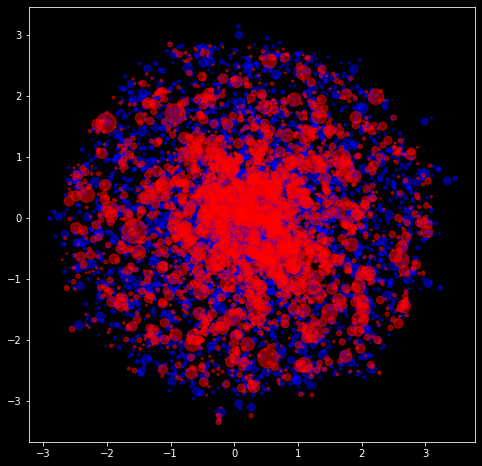

--------------------------------------------------------------------------------
epoch: 2


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.2970649913655526


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.31710565090179443
valid_hitrate: 1037/2447
valid_ndcg: 539.43/2447


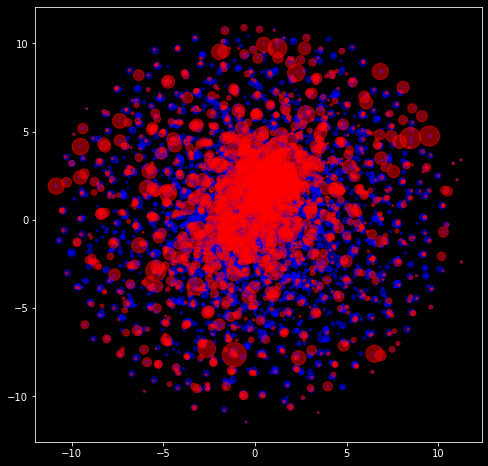

--------------------------------------------------------------------------------
epoch: 3


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.25732673135103357


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.30477890372276306
valid_hitrate: 1067/2447
valid_ndcg: 566.81/2447


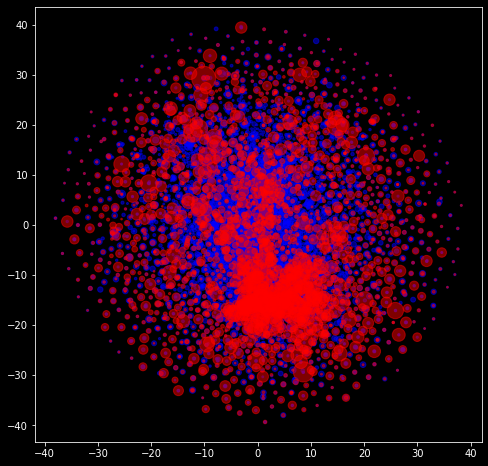

--------------------------------------------------------------------------------
epoch: 4


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.23498159007252198


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2966856062412262
valid_hitrate: 1096/2447
valid_ndcg: 597.84/2447


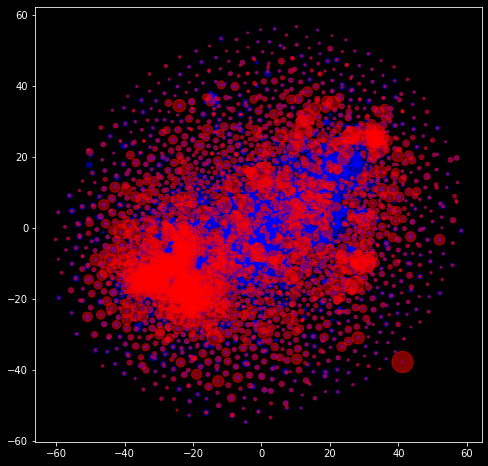

--------------------------------------------------------------------------------
epoch: 5


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.21541799339636458


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2878158986568451
valid_hitrate: 1167/2447
valid_ndcg: 648.34/2447


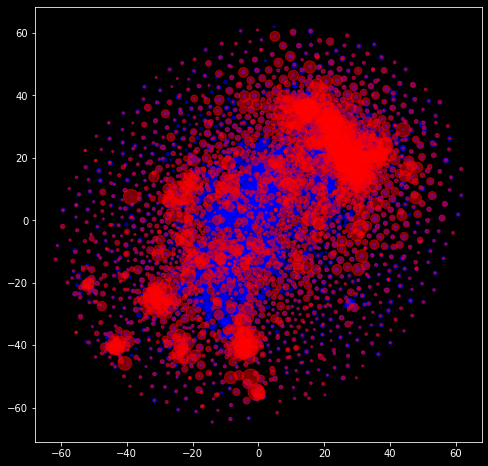

--------------------------------------------------------------------------------
epoch: 6


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.1979600727870202


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.27891555428504944
valid_hitrate: 1197/2447
valid_ndcg: 663.5/2447


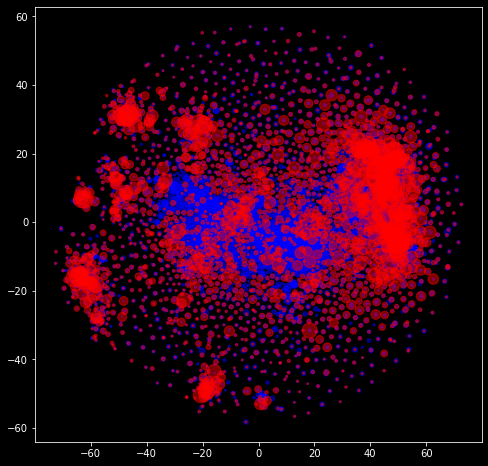

--------------------------------------------------------------------------------
epoch: 7


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.18402282058880592


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.27067434787750244
valid_hitrate: 1217/2447
valid_ndcg: 681.19/2447


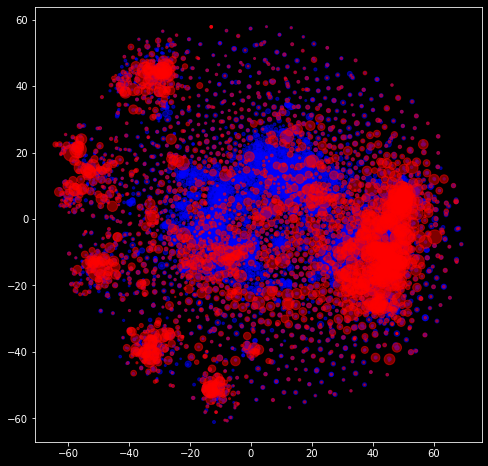

--------------------------------------------------------------------------------
epoch: 8


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.17365929991474952


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.26451191306114197
valid_hitrate: 1248/2447
valid_ndcg: 693.53/2447


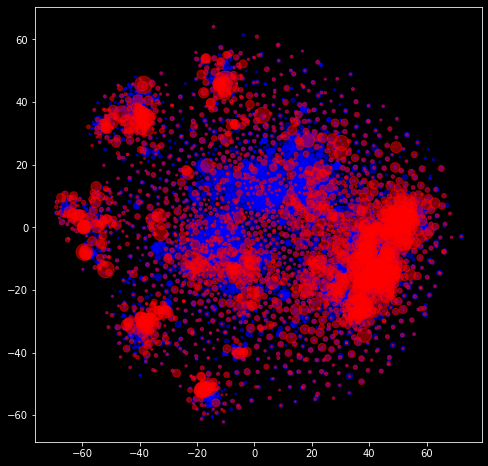

--------------------------------------------------------------------------------
epoch: 9


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.16594358038215737


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.25993847846984863
valid_hitrate: 1265/2447
valid_ndcg: 710.53/2447


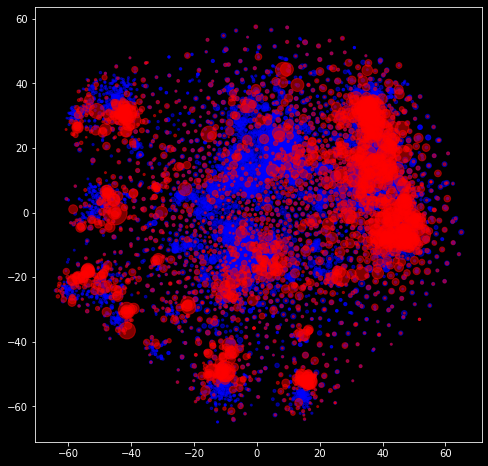

--------------------------------------------------------------------------------
epoch: 10


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.16071011594140716


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.25637581944465637
valid_hitrate: 1272/2447
valid_ndcg: 719.68/2447


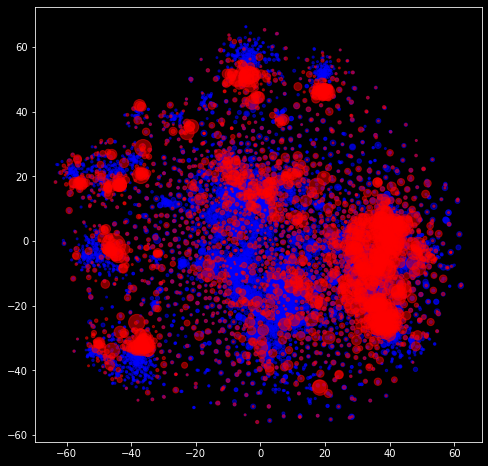

--------------------------------------------------------------------------------
epoch: 11


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.15745231626233505


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.25346410274505615
valid_hitrate: 1306/2447
valid_ndcg: 738.59/2447


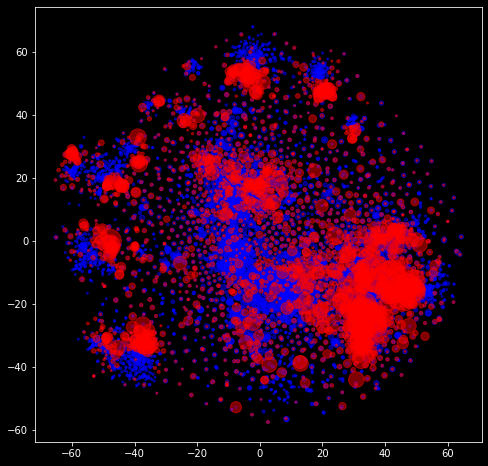

--------------------------------------------------------------------------------
epoch: 12


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.15504680152650904


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.25152790546417236
valid_hitrate: 1322/2447
valid_ndcg: 754.76/2447


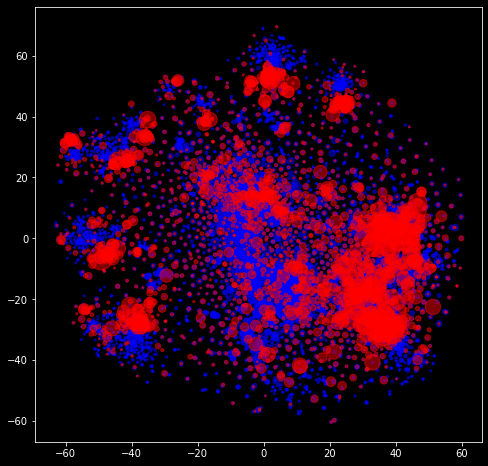

--------------------------------------------------------------------------------
epoch: 13


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.15350787279181455


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24969227612018585
valid_hitrate: 1318/2447
valid_ndcg: 746.95/2447


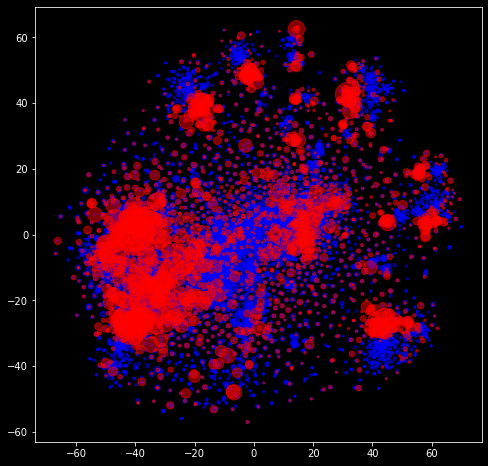

--------------------------------------------------------------------------------
epoch: 14


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.15211997247491207


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2486341893672943
valid_hitrate: 1327/2447
valid_ndcg: 761.46/2447


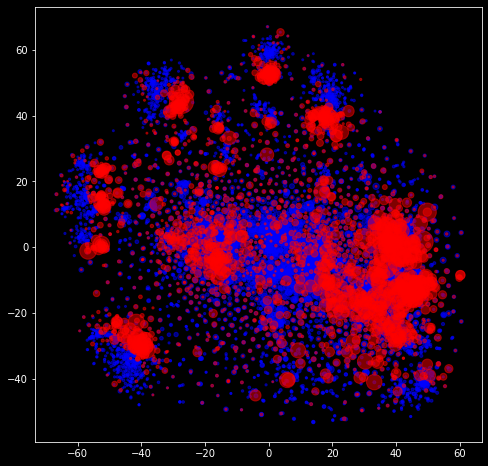

--------------------------------------------------------------------------------
epoch: 15


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.15148692410341733


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24697621166706085
valid_hitrate: 1354/2447
valid_ndcg: 764.83/2447


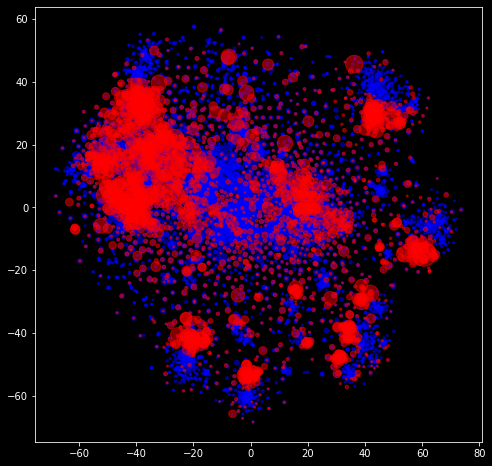

--------------------------------------------------------------------------------
epoch: 16


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.15108323097229004


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24592538177967072
valid_hitrate: 1356/2447
valid_ndcg: 764.45/2447


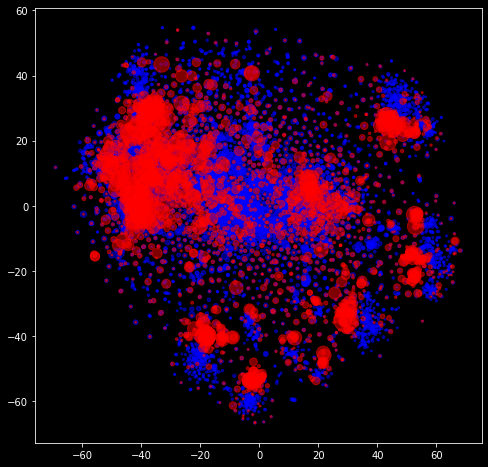

--------------------------------------------------------------------------------
epoch: 17


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.1504990325860328


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24476730823516846
valid_hitrate: 1333/2447
valid_ndcg: 764.29/2447


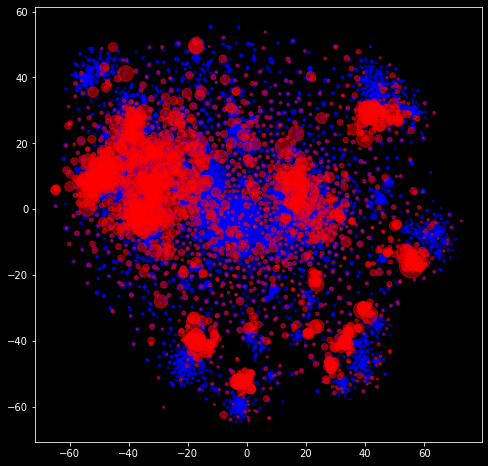

--------------------------------------------------------------------------------
epoch: 18


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.15023472054778594


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2430143505334854
valid_hitrate: 1348/2447
valid_ndcg: 777.85/2447


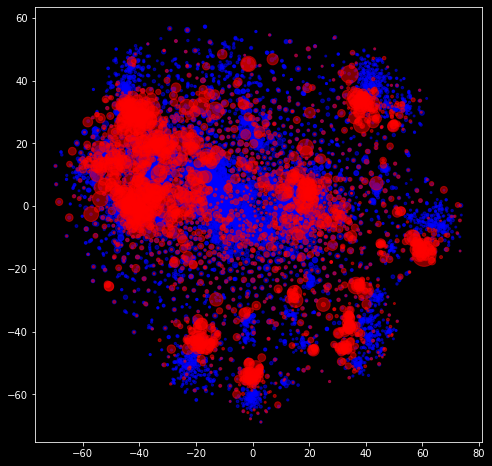

--------------------------------------------------------------------------------
epoch: 19


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.1497899137086269


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24140457808971405
valid_hitrate: 1340/2447
valid_ndcg: 766.14/2447


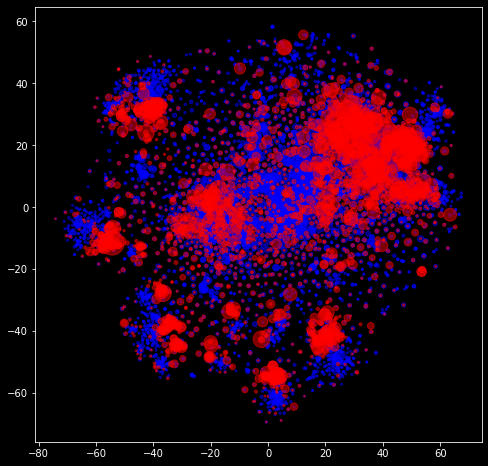

--------------------------------------------------------------------------------
epoch: 20


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.1499719099380583


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2423733025789261
valid_hitrate: 1353/2447
valid_ndcg: 769.04/2447


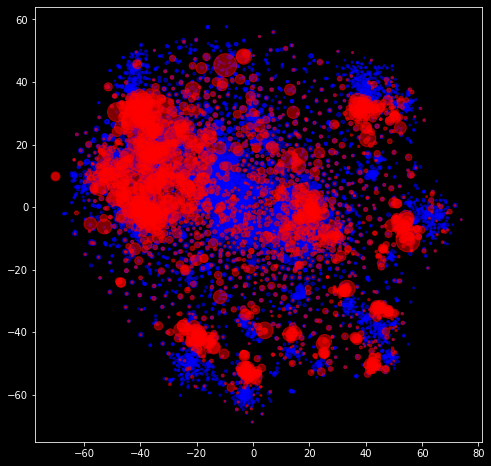

--------------------------------------------------------------------------------
epoch: 21


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14956927003036619


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24137933552265167
valid_hitrate: 1354/2447
valid_ndcg: 780.1/2447


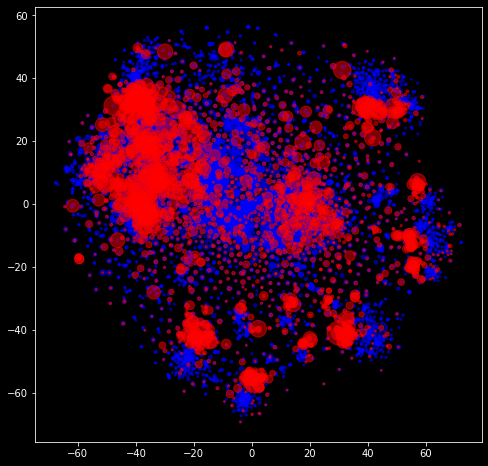

--------------------------------------------------------------------------------
epoch: 22


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14917249392464524


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24093514680862427
valid_hitrate: 1366/2447
valid_ndcg: 785.92/2447


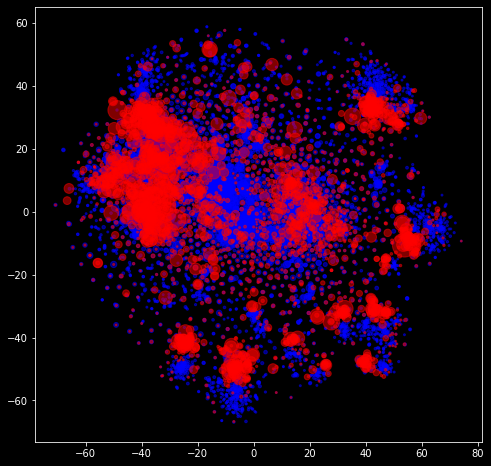

--------------------------------------------------------------------------------
epoch: 23


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14927900789295814


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.240036278963089
valid_hitrate: 1370/2447
valid_ndcg: 778.97/2447


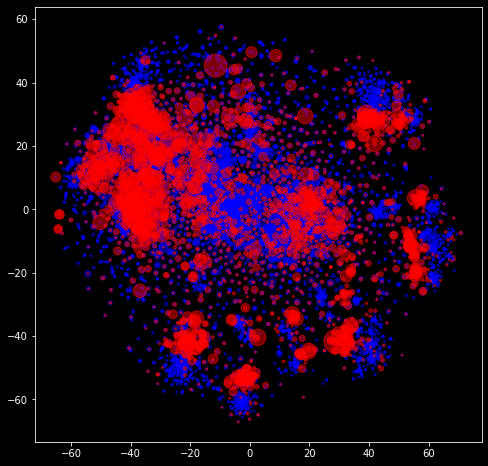

--------------------------------------------------------------------------------
epoch: 24


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14892324883276256


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24114187061786652
valid_hitrate: 1370/2447
valid_ndcg: 776.52/2447


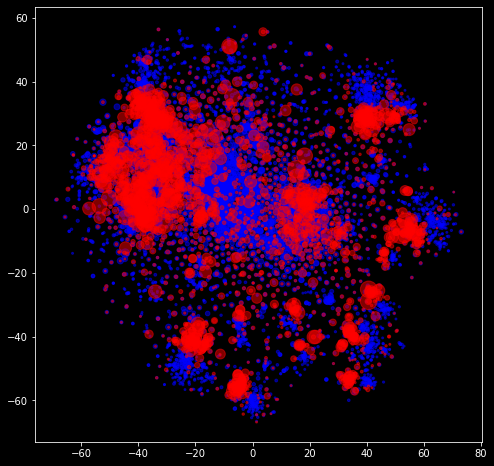

--------------------------------------------------------------------------------
epoch: 25


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14892475267979488


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24071572721004486
valid_hitrate: 1359/2447
valid_ndcg: 776.5/2447


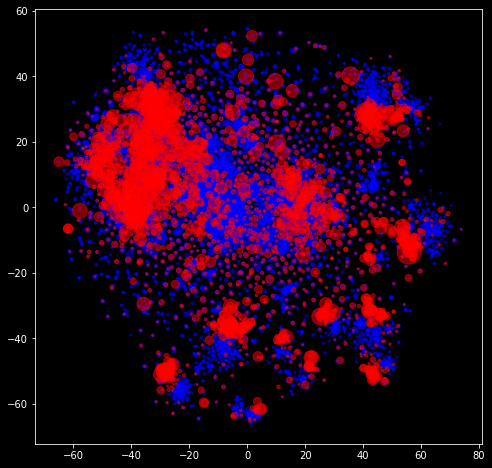

--------------------------------------------------------------------------------
epoch: 26


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14874990245434627


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23984183371067047
valid_hitrate: 1363/2447
valid_ndcg: 783.56/2447


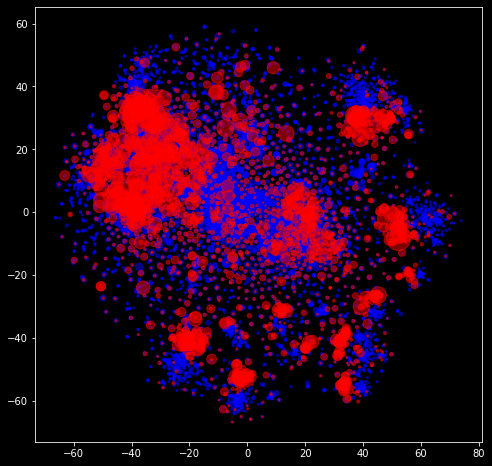

--------------------------------------------------------------------------------
epoch: 27


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14862702755715834


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.24008223414421082
valid_hitrate: 1349/2447
valid_ndcg: 780.15/2447


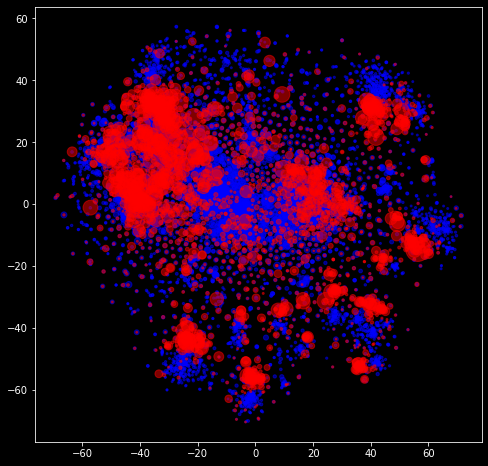

--------------------------------------------------------------------------------
epoch: 28


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14865349303365377


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23971883952617645
valid_hitrate: 1372/2447
valid_ndcg: 794.93/2447


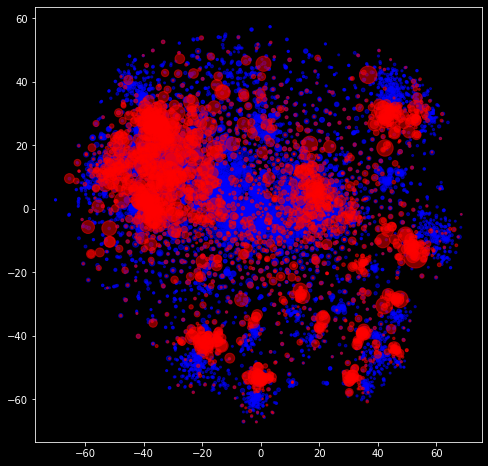

--------------------------------------------------------------------------------
epoch: 29


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14846815582345294


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2390495091676712
valid_hitrate: 1368/2447
valid_ndcg: 780.22/2447


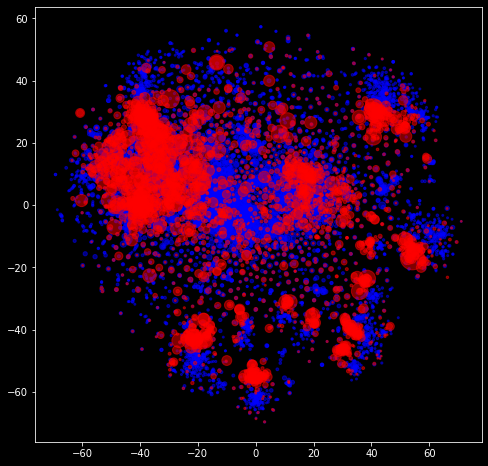

--------------------------------------------------------------------------------
epoch: 30


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14857015076108004


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23918138444423676
valid_hitrate: 1369/2447
valid_ndcg: 781.66/2447


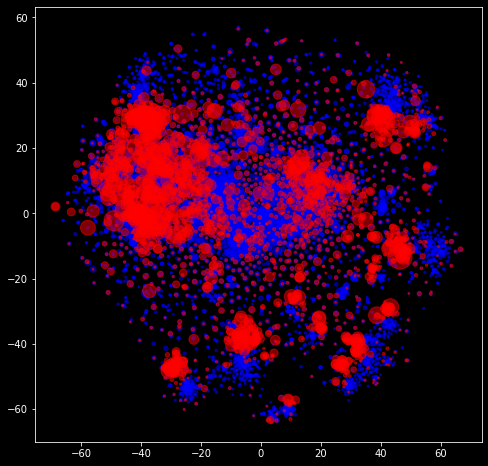

--------------------------------------------------------------------------------
epoch: 31


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.1486144787510028


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2389841377735138
valid_hitrate: 1367/2447
valid_ndcg: 775.47/2447


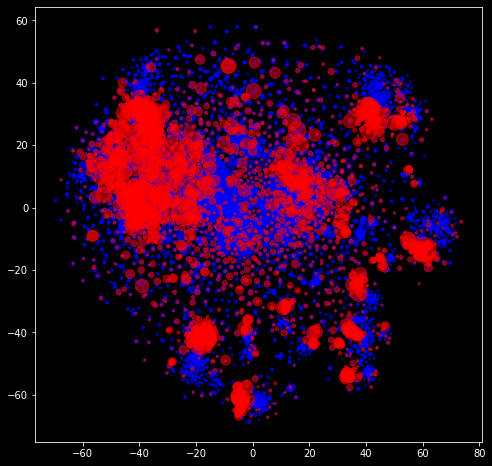

--------------------------------------------------------------------------------
epoch: 32


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14807578874508123


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23894809186458588
valid_hitrate: 1351/2447
valid_ndcg: 781.59/2447


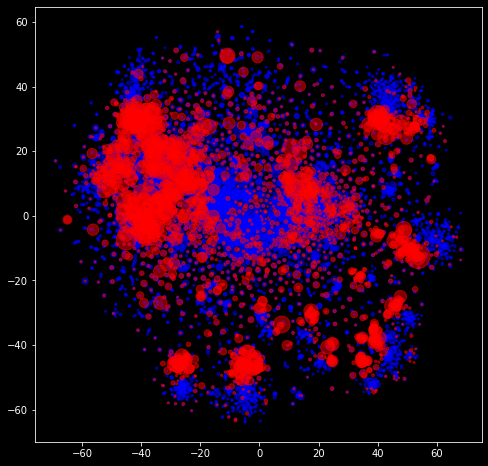

--------------------------------------------------------------------------------
epoch: 33


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14858611700422478


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2381899356842041
valid_hitrate: 1384/2447
valid_ndcg: 789.82/2447


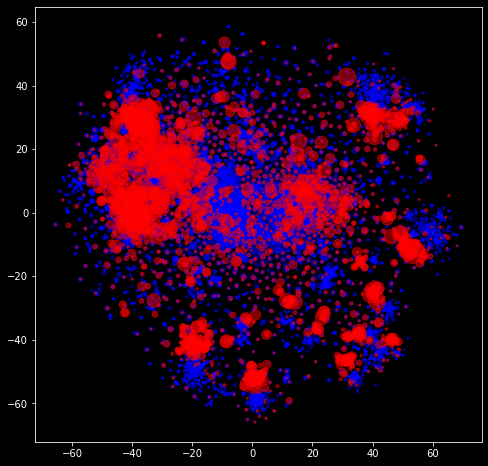

--------------------------------------------------------------------------------
epoch: 34


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.1482247677461015


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23922568559646606
valid_hitrate: 1368/2447
valid_ndcg: 778.3/2447


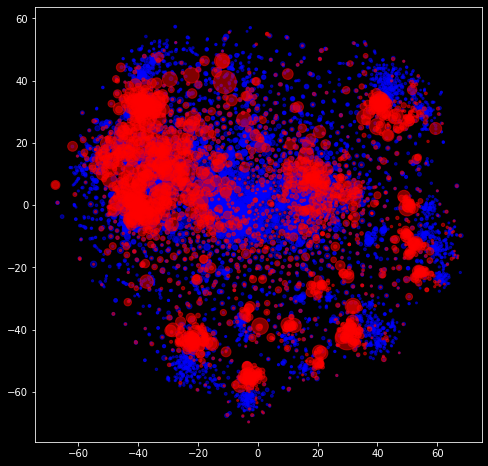

--------------------------------------------------------------------------------
epoch: 35


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14827926464729907


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2390318214893341
valid_hitrate: 1372/2447
valid_ndcg: 788.89/2447


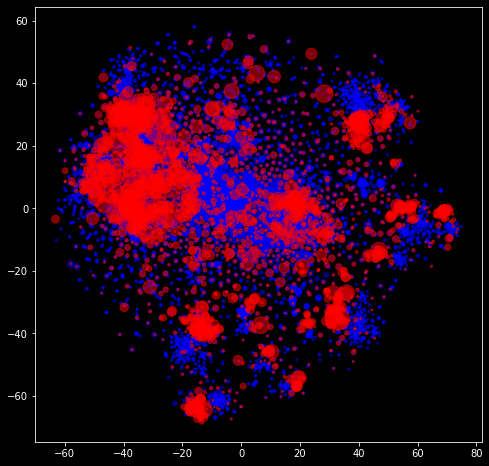

--------------------------------------------------------------------------------
epoch: 36


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14800688952051533


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.2388196736574173
valid_hitrate: 1391/2447
valid_ndcg: 803.4/2447


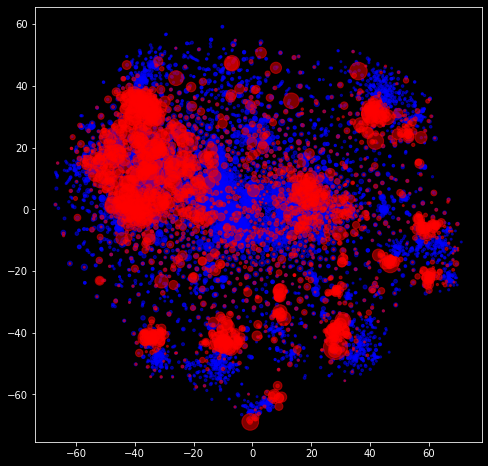

--------------------------------------------------------------------------------
epoch: 37


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14806360466630047


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23864278197288513
valid_hitrate: 1369/2447
valid_ndcg: 781.52/2447


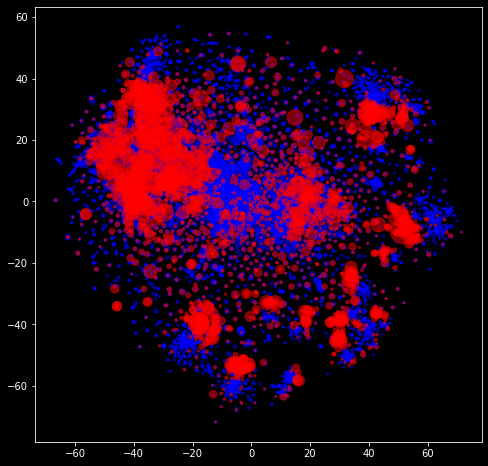

--------------------------------------------------------------------------------
epoch: 38


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14833887568943163


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23966661095619202
valid_hitrate: 1353/2447
valid_ndcg: 787.9/2447


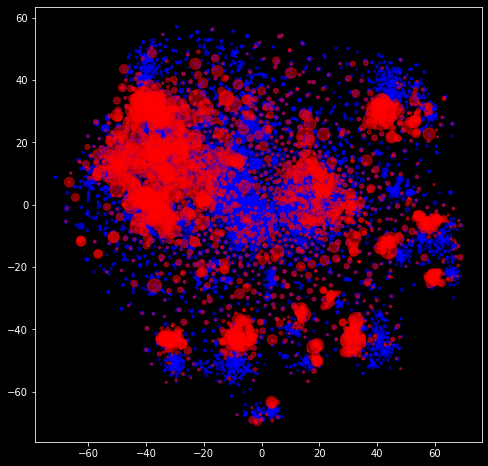

--------------------------------------------------------------------------------
epoch: 39


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14773683218743788


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23885026574134827
valid_hitrate: 1389/2447
valid_ndcg: 790.46/2447


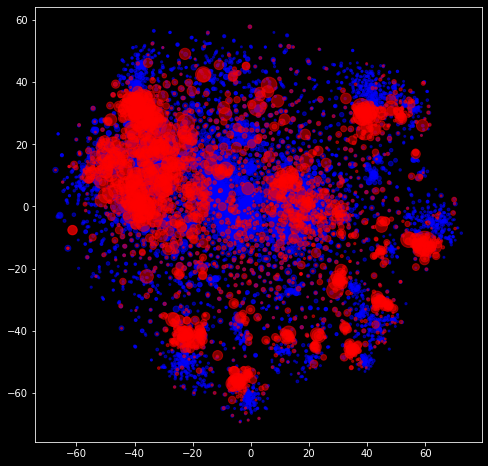

--------------------------------------------------------------------------------
epoch: 40


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.14805662429145494


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.238407701253891
valid_hitrate: 1372/2447
valid_ndcg: 789.99/2447


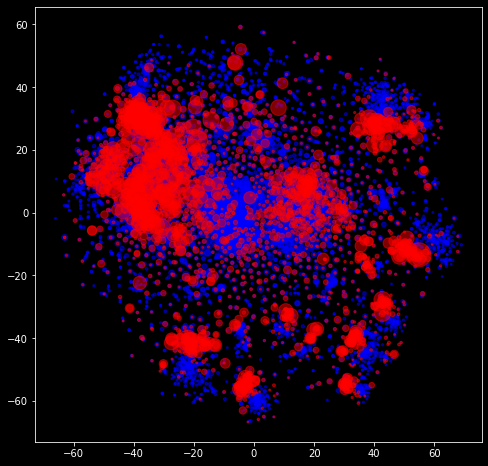

--------------------------------------------------------------------------------
epoch: 41


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 0.1480788825694179


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 0.23818418383598328
valid_hitrate: 1365/2447
valid_ndcg: 782.19/2447


KeyboardInterrupt: 

In [151]:
metric_trainer.fit(train_loader, valid_loader, epochs=50, plot=True)

In [ ]:
# 520
# 1380 max

In [152]:
lists = metric_trainer.predict_lists().numpy().argsort()
hits = 0
for i in range(N_USERS):
    user, item, _ = valid_set[i]
    user, item = user.item(), item.item()
    positives = data_train.loc[data_train.user_id == user].item_id.to_numpy()
    candidates = lists[i][~np.isin(lists[i], positives)]
    hits += (item in candidates[:10])
print(hits/N_USERS)

0.06048222313036371


## pytorch cml

In [12]:
from itertools import product
import PytorchCML
from PytorchCML import losses, models, samplers, regularizers, evaluators, trainers
from sklearn.model_selection import train_test_split
# from sklearn.decomposition import TruncatedSVD
# from scipy.sparse import csr_matrix

ModuleNotFoundError: No module named 'PytorchCML'

In [ ]:
movielens = pd.read_csv(
  'http://files.grouplens.org/datasets/movielens/ml-100k/u.data', 
  sep='\t', header=None, index_col=None,
)
movielens.columns = ["user_id", "item_id", "rating", "timestamp"]
movielens.user_id -= 1
movielens.item_id -= 1
movielens.rating = (movielens.rating >= 4).astype(int)
n_user = movielens.user_id.nunique()
n_item = movielens.item_id.nunique()

train, test = train_test_split(movielens)

In [ ]:
ptcml_data = data.copy()
ptcml_train = data_train.copy()
ptcml_train.rating = 1
ptcml_valid = data_valid.copy()
ptcml_valid.rating = 1

In [ ]:
# all user item pairs
df_all = pd.DataFrame(
    [[u, i] for u,i in product(range(N_USERS), range(N_ITEMS))],
    columns=["user_id", "item_id"]
)

# frag train pairs
df_all = pd.merge(
    df_all, 
    ptcml_train[["user_id", "item_id", "rating"]], 
    on=["user_id", "item_id"], 
    how="left"
)

# remove train pairs
test = pd.merge(
    df_all[df_all.rating.isna()][["user_id", "item_id"]], 
    ptcml_valid[["user_id", "item_id", "rating"]], 
    on=["user_id", "item_id"], 
    how="left"
).fillna(0)

# numpy array
train_set = ptcml_train[["user_id", "item_id"]].values
test_set = test[["user_id", "item_id", "rating"]].values

# to torch.Tensor
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
train_set = torch.LongTensor(train_set).to(device)
test_set = torch.LongTensor(test_set).to(device)

In [ ]:
lr = 1e-3
n_dim = 10
model = models.CollaborativeMetricLearning(N_USERS, N_ITEMS, n_dim).to(device)
optimizer = Adam(model.parameters(), lr=lr)
criterion = losses.SumTripletLoss(margin=1).to(device)
sampler = samplers.BaseSampler(train_set, N_USERS, N_ITEMS, device=device, strict_negative=False)

score_function_dict = {
    "nDCG" : evaluators.ndcg,
    "MAP" : evaluators.average_precision,
    "Recall": evaluators.recall
}
evaluator = evaluators.UserwiseEvaluator(test_set, score_function_dict, ks=[5,10])
trainer = trainers.CMLTrainer(model, optimizer, criterion, sampler)

In [ ]:
trainer.fit(n_batch=512, n_epoch=50, valid_evaluator=evaluator, valid_per_epoch=10)

# hyperbolic metric learning

## classes

### embedding

In [19]:
class HyperEmbedding(nn.Module):
    '''https://github.com/evfro/HyperbolicRecommenders/blob/master/src/models.py'''
    def __init__(
        self, num_embeddings, embedding_dim, manifold=geoopt.Euclidean(), _weight=None
    ):

        super(HyperEmbedding, self).__init__()
        if isinstance(embedding_dim, int):
            embedding_dim = (embedding_dim,)
        self.num_embeddings = num_embeddings
        self.embedding_dim = embedding_dim
        self.manifold = manifold

        if _weight is None:
            _weight = torch.Tensor(num_embeddings, *embedding_dim)
            self.weight = geoopt.ManifoldParameter(_weight, manifold=self.manifold)
            self.reset_parameters()
        else:
            assert _weight.shape == (
                num_embeddings,
                *embedding_dim,
            ), "_weight MUST be of shape (num_embeddings, *embedding_dim)"
            self.weight = geoopt.ManifoldParameter(_weight, manifold=self.manifold)

    def reset_parameters(self):
        with torch.no_grad():
            data = self.manifold.random_normal(
                *self.weight.shape, mean=0, std=1e-2
            ).data
            # @TODO: better init
            self.weight.data = data

    def forward(self, input):
        shape = list(input.shape) + list(self.weight.shape[1:])
        shape = tuple(shape)
        return self.weight.index_select(0, input.reshape(-1)).view(shape)

In [20]:
class HyperEmbedding(nn.Module):
    """https://github.com/mil-tokyo/hyperbolic_nn_plusplus/blob/main/geoopt_plusplus/modules/embedding.py"""
    __constants__ = ['num_embeddings', 'embedding_dim', 'padding_idx', 'max_norm',
                     'norm_type', 'scale_grad_by_freq', 'sparse']

    def __init__(self, num_embeddings, embedding_dim, padding_idx=None,
                 max_norm=None, norm_type=2., scale_grad_by_freq=False,
                 sparse=False, _weight=None, init_std=1e-2, manifold=geoopt.Euclidean()):
        super(HyperEmbedding, self).__init__()
        self.manifold = manifold
        self.init_std = init_std
        self.num_embeddings = num_embeddings
        self.embedding_dim = embedding_dim
        if padding_idx is not None:
            if padding_idx > 0:
                assert padding_idx < self.num_embeddings, 'Padding_idx must be within num_embeddings'
            elif padding_idx < 0:
                assert padding_idx >= -self.num_embeddings, 'Padding_idx must be within num_embeddings'
                padding_idx = self.num_embeddings + padding_idx
        self.padding_idx = padding_idx
        self.max_norm = max_norm
        self.norm_type = norm_type
        self.scale_grad_by_freq = scale_grad_by_freq
        if _weight is None:
            self.weight = geoopt.ManifoldParameter(torch.empty(num_embeddings, embedding_dim), manifold=manifold)
            self.reset_parameters()
        else:
            assert list(_weight.shape) == [num_embeddings, embedding_dim], \
                'Shape of weight does not match num_embeddings and embedding_dim'
        self.sparse = sparse

    # def reset_parameters(self):
    #     with torch.no_grad():
    #         direction = torch.randn_like(self.weight)
    #         direction /= direction.norm(dim=-1, keepdim=True).clamp_min(1e-7)
    #         distance = torch.empty(self.num_embeddings, 1).normal_(std=self.init_std / self.manifold.c.data.sqrt())
    #         self.weight.data.copy_(self.manifold.expmap0(direction * distance))
    #         if self.padding_idx is not None:
    #             self.weight[self.padding_idx].fill_(0)

    def reset_parameters(self):
        with torch.no_grad():
            data = self.manifold.random_normal(
                *self.weight.shape, mean=0, std=1e-2
            ).data
            self.weight.data.copy_(data)
            if self.padding_idx is not None:
                self.weight[self.padding_idx].fill_(0)

    def forward(self, input):
        return (F.embedding(
            input, self.weight, self.padding_idx, self.max_norm,
            self.norm_type, self.scale_grad_by_freq, self.sparse))

### model

In [21]:
class HyperCML(nn.Module):
    def __init__(self, n_user, n_item, embedding_dim=16, dropout_rate=0.5, manifold=geoopt.PoincareBall(), **kwargs):
        super().__init__()
        self.n_user = n_user
        self.n_item = n_item
        self.embedding_dim = embedding_dim
        self.manifold = manifold

        self.user_embedding = HyperEmbedding(self.n_user, self.embedding_dim, manifold=self.manifold, **kwargs)
        self.item_embedding = HyperEmbedding(self.n_item, self.embedding_dim, manifold=self.manifold, **kwargs)
        self.dropuot = nn.Dropout(p=dropout_rate)

    def from_pretrained(self, *args, **kwargs):
        raise NotImplemented

    def forward(self, users, pos_items, neg_items):
        user_embedding = self.user_embedding(users)
        pos_item_embedding = self.dropuot(self.item_embedding(pos_items))
        neg_item_embedding = self.dropuot(self.item_embedding(neg_items))

        return user_embedding, pos_item_embedding, neg_item_embedding

    def predict(self, users, pos_items, neg_items):
        user_embedding, pos_item_embedding, neg_item_embedding = self.forward(users, pos_items, neg_items)
        pos_item_dist = self.manifold.dist(user_embedding, pos_item_embedding)
        neg_item_dist = self.manifold.dist(user_embedding, neg_item_embedding)

        return pos_item_dist, neg_item_dist

### distortion loss

In [22]:
class DistortionLoss(nn.Module):
    def __init__(self, distance_function, mapping_function=lambda x: x, reduction='mean'):
        super().__init__()
        self.distance_function = distance_function
        self.mapping_function = mapping_function
        self.reduction = reduction
    
    def forward(self, anchor, positive, negative):
        hyper_pos_dist = self.distance_function(self.mapping_function(anchor), self.mapping_function(positive))
        euclid_pos_dist = torch.cdist(anchor, positive)[:, 0, :]
        pos_ratio = torch.abs(hyper_pos_dist - euclid_pos_dist) / euclid_pos_dist

        hyper_neg_dist = self.distance_function(self.mapping_function(anchor), self.mapping_function(negative))
        euclid_neg_dist = torch.cdist(anchor, negative)[:, 0, :]
        neg_ratio = torch.abs(hyper_neg_dist - euclid_neg_dist) / euclid_neg_dist

        if self.reduction == 'mean':
            return torch.mean(pos_ratio) + torch.mean(neg_ratio)
        elif self.reduction == 'sum':
            return torch.sum(pos_ratio) + torch.sum(neg_ratio)
        elif self.reduction == 'none':
            return pos_ratio + neg_ratio

In [23]:
class EmbeddingDistortionLoss(nn.Module):
    def __init__(self, distance_function, mapping_function=lambda x: x, reduction='mean'):
        super().__init__()
        self.distance_function = distance_function
        self.reduction = reduction
    
    def _distortion(self, u, v):
        hyper_dist = self.distance_function(u, v)
        euclid_dist = torch.tensor(1.4142)
        return torch.abs(hyper_dist - euclid_dist) / euclid_dist
    
    def forward(self, anchor, positive, negative):
        batch_size = anchor.shape[0]
        pos_distortion = self._distortion(anchor, positive)
        neg_distortion = self._distortion(anchor, negative)

        if self.reduction == 'mean':
            coeff = 1 / (batch_size * (batch_size - 1))
            return coeff * torch.sum(pos_distortion.mean(dim=1)) + coeff * torch.sum(neg_distortion.mean(dim=1))
        elif self.reduction == 'sum':
            return torch.sum(pos_distortion) + torch.sum(neg_distortion)
        elif self.reduction == 'none':
            return pos_distortion + neg_distortion

In [24]:
# d_Dij = self._dist_pos
# d_Eij = self._eclidean_manifold.distance(self._manifold.to_tangent(self.user_vectors, self._c),
#                                             self._manifold.to_tangent(self.pos_item_vectors, self._c), self._c)
# d_Dik = self._dist_neg
# d_Eik = self._eclidean_manifold.distance(self._manifold.to_tangent(self.user_vectors, self._c),
#                                             self._manifold.to_tangent(self.neg_item_vectors, self._c), self._c)
# self.loss_d1 = tf.reduce_mean(tf.nn.relu(tf.abs(d_Dij**0.5 - d_Eij**0.5) / (d_Eij**0.5 + training_config["epsilon"])))
# self.loss_d2 = tf.reduce_mean(tf.nn.relu(tf.abs(d_Dik**0.5 - d_Eik**0.5) / (d_Eik**0.5 + training_config["epsilon"])))

In [25]:
class DistortionLoss(nn.Module):
    def __init__(self, manifold, reduction='mean', eps=1e-6):
        super().__init__()
        self.manifold = manifold
        self.reduction = reduction
        self.eps = eps

    def _distortion(self, u, v):
        hyper_dist = self.manifold.dist(u, v)#**0.5
        euclid_dist = torch.cdist(self.manifold.logmap0(u), self.manifold.logmap0(v))[:, 0, :]#**0.5
        return torch.abs(hyper_dist - euclid_dist) / (euclid_dist + self.eps)
    
    def forward(self, anchor, positive, negative):
        batch_size = anchor.shape[0]
        pos_distortion = self._distortion(anchor, positive)
        neg_distortion = self._distortion(anchor, negative)

        # if self.reduction == 'mean':
        #     coeff = 2 / (batch_size * (batch_size - 1))
        #     return coeff * torch.sum(pos_distortion.mean(dim=1)) + coeff * torch.sum(neg_distortion.mean(dim=1))
        if self.reduction == 'mean':
            return torch.mean(pos_distortion) + torch.mean(neg_distortion)
        elif self.reduction == 'sum':
            return torch.sum(pos_distortion) + torch.sum(neg_distortion)
        elif self.reduction == 'none':
            return pos_distortion + neg_distortion

## training

In [101]:
cfg = dotdict()
cfg['bs'] = 512
cfg['lr'] = 1e-3
cfg['neg_samples'] = 10
cfg['c'] = 1
cfg['embedding_dim'] = 256
cfg['margin'] = 0.5
cfg['lam'] = 1
cfg['reduction'] = 'mean'
cfg['weighted'] = False
cfg['max_norm'] = 1
cfg['drop_rate'] = 0

In [102]:
manifold = geoopt.PoincareBall(c=cfg.c)

In [103]:
full_set = PariwiseDataset(data, N_USERS, N_ITEMS, neg_samples=cfg.neg_samples)
train_set = PariwiseDataset(
    data_train, 
    N_USERS, 
    N_ITEMS, 
    neg_samples=cfg.neg_samples, 
    weights=(item_sizes if cfg.weighted else None))

valid_set = PariwiseDataset(data_valid, N_USERS, N_ITEMS, neg_samples=100)
test_set = PariwiseDataset(data_test, N_USERS, N_ITEMS, neg_samples=100)

full_loader = DataLoader(full_set, batch_size=cfg.bs, shuffle=True)
train_loader = DataLoader(train_set, batch_size=cfg.bs, shuffle=True)
valid_loader = DataLoader(valid_set, batch_size=N_USERS, shuffle=False)
test_loader = DataLoader(test_set, batch_size=N_USERS, shuffle=False)

In [104]:
hyper_model = HyperCML(
    N_USERS, 
    N_ITEMS, 
    embedding_dim=cfg.embedding_dim, 
    dropout_rate=cfg.drop_rate,
    manifold=manifold, 
    max_norm=cfg.max_norm)
# hyper_criterion = nn.TripletMarginWithDistanceLoss(margin=1, distance_function=manifold.dist, reduction=cfg.reduction)
hyper_criterion = AdditiveLoss(
    nn.TripletMarginWithDistanceLoss(margin=cfg.margin, distance_function=manifold.dist, reduction=cfg.reduction),
    DistortionLoss(manifold=manifold, reduction=cfg.reduction),
    coefficients=[1, cfg.lam]
)

In [105]:
hyper_trainer = MetricTrainer(hyper_model, hyper_criterion)
# hyper_trainer.optimizer = RiemannianAdam(hyper_trainer.model.parameters(), lr=1e-3)
# hyper_trainer.scheduler = ExponentialLR(hyper_trainer.optimizer, gamma=0.99)

In [106]:
# hyper_trainer.optimizer = RiemannianAdam(hyper_trainer.model.parameters(), lr=1e-4)

  0%|          | 0/50 [00:00<?, ?it/s]

epoch: 1


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.482758543254193


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.468782901763916
valid_hitrate: 917/2447
valid_ndcg: 428.12/2447


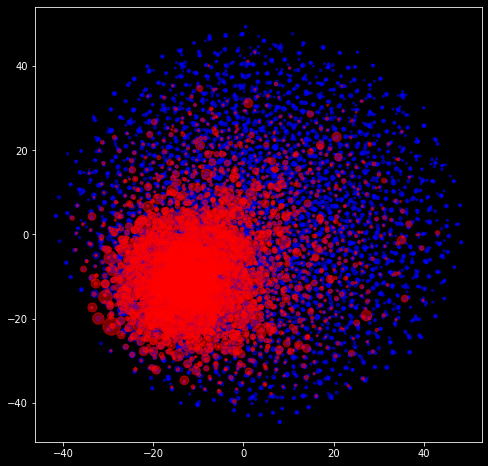

--------------------------------------------------------------------------------
epoch: 2


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.4516211367402403


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.4441184997558594
valid_hitrate: 871/2447
valid_ndcg: 416.14/2447


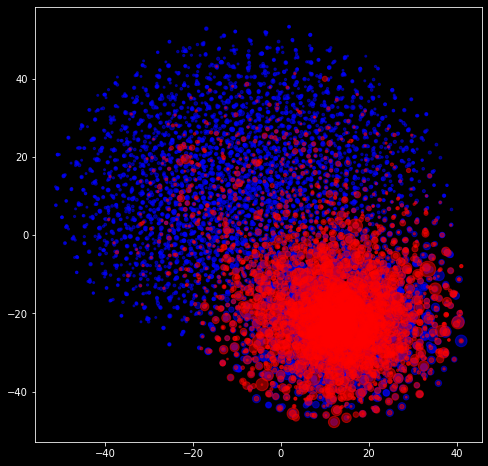

--------------------------------------------------------------------------------
epoch: 3


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.424635495190845


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.419620990753174
valid_hitrate: 844/2447
valid_ndcg: 386.86/2447


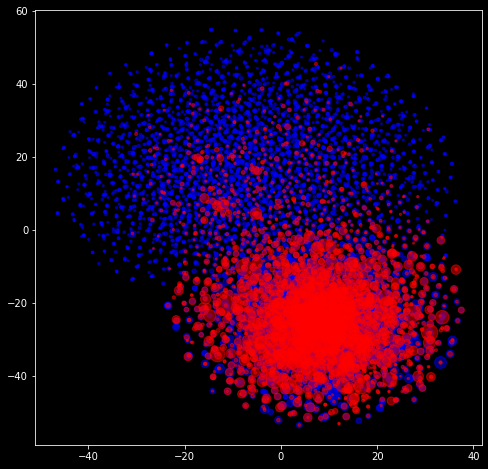

--------------------------------------------------------------------------------
epoch: 4


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.3981586326479287


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.3960585594177246
valid_hitrate: 838/2447
valid_ndcg: 397.84/2447


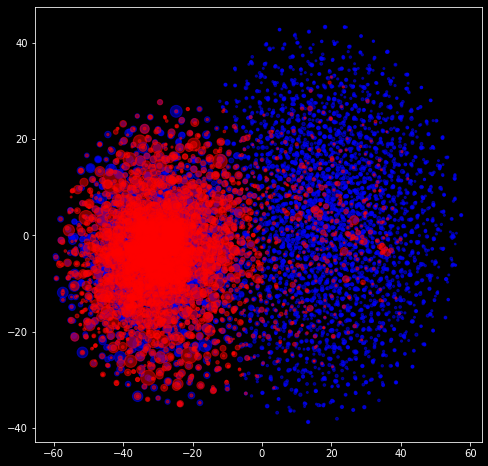

--------------------------------------------------------------------------------
epoch: 5


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.371557271917453


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.372570514678955
valid_hitrate: 822/2447
valid_ndcg: 382.54/2447


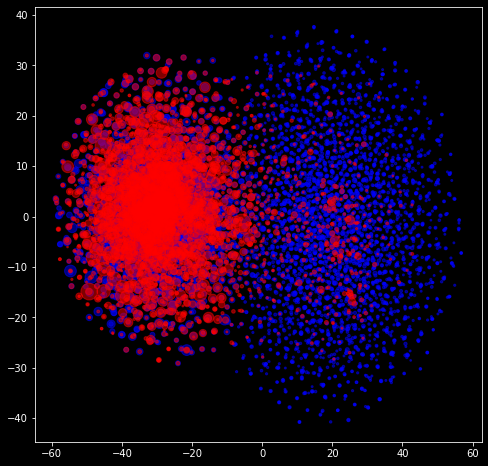

--------------------------------------------------------------------------------
epoch: 6


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.3463304279986477


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.3498830795288086
valid_hitrate: 857/2447
valid_ndcg: 392.69/2447


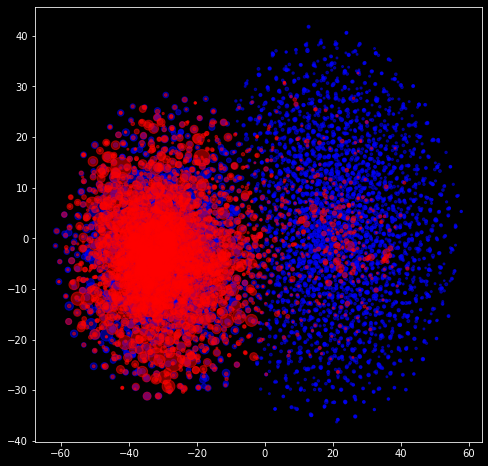

--------------------------------------------------------------------------------
epoch: 7


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.3268803102183715


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.334826946258545
valid_hitrate: 890/2447
valid_ndcg: 417.24/2447


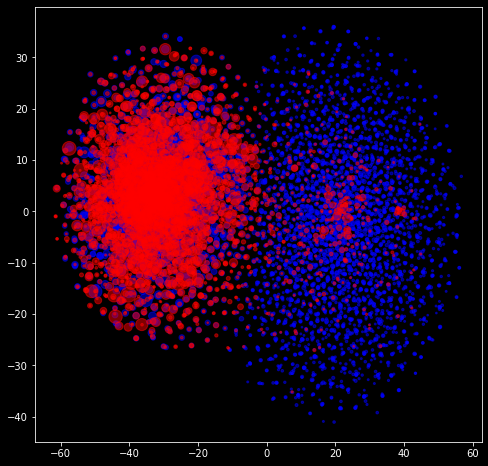

--------------------------------------------------------------------------------
epoch: 8


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.3145630422062897


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.324798345565796
valid_hitrate: 906/2447
valid_ndcg: 423.02/2447


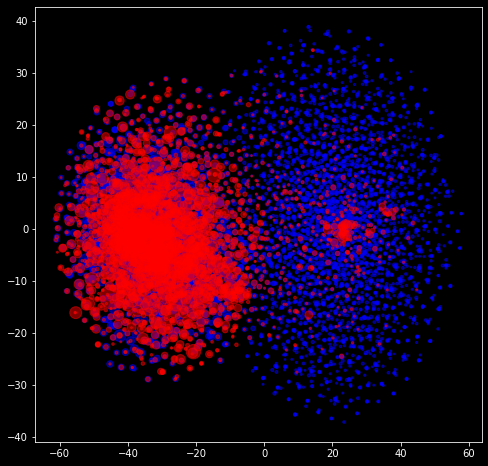

--------------------------------------------------------------------------------
epoch: 9


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.3073008559761248


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.319532632827759
valid_hitrate: 893/2447
valid_ndcg: 420.84/2447


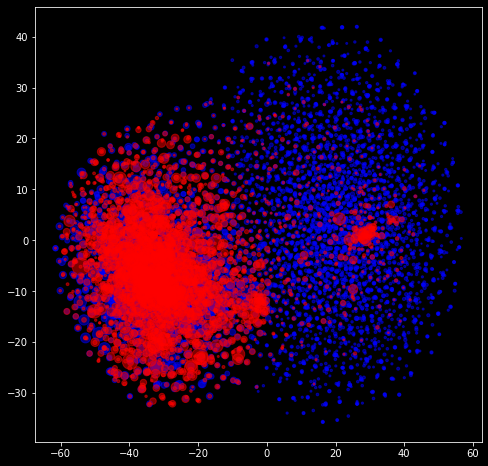

--------------------------------------------------------------------------------
epoch: 10


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.3022268754649535


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.315173625946045
valid_hitrate: 900/2447
valid_ndcg: 413.04/2447


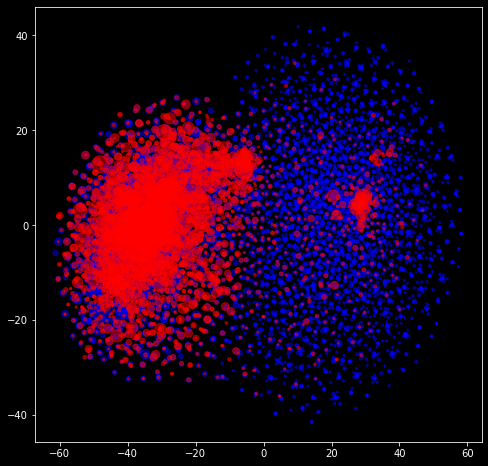

--------------------------------------------------------------------------------
epoch: 11


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.2981916622341614


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.3126132488250732
valid_hitrate: 956/2447
valid_ndcg: 448.1/2447


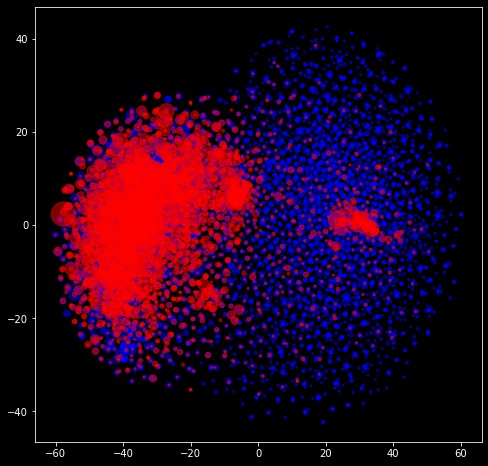

--------------------------------------------------------------------------------
epoch: 12


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.2952558382643455


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.3100333213806152
valid_hitrate: 979/2447
valid_ndcg: 467.29/2447


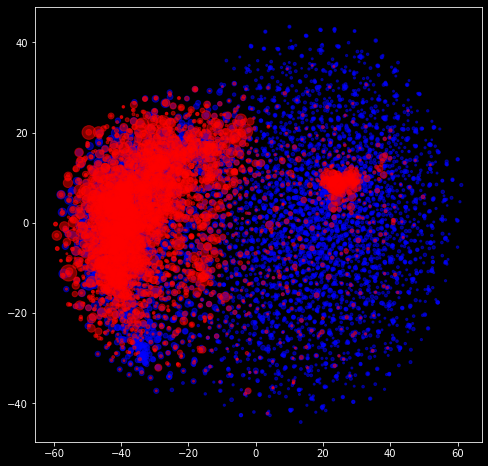

--------------------------------------------------------------------------------
epoch: 13


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.292704323823539


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.309023141860962
valid_hitrate: 962/2447
valid_ndcg: 454.63/2447


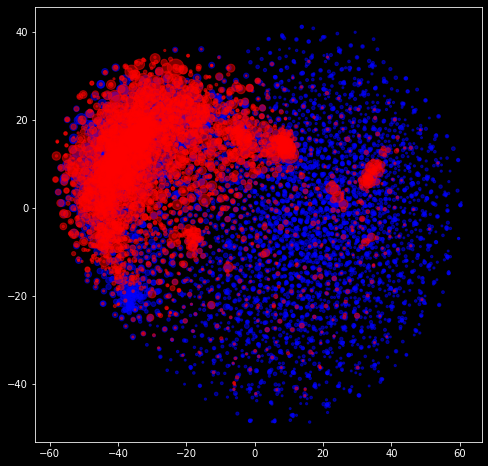

--------------------------------------------------------------------------------
epoch: 14


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.2906329269808623


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.3070483207702637
valid_hitrate: 997/2447
valid_ndcg: 481.51/2447


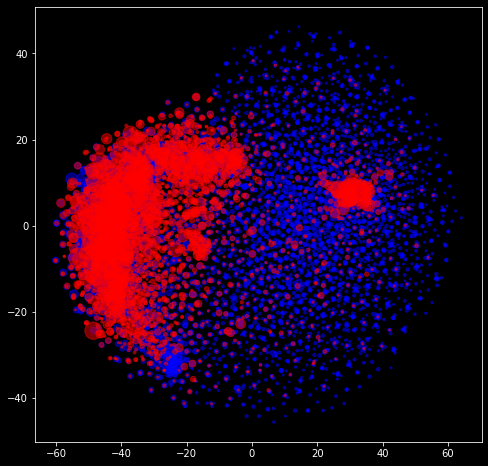

--------------------------------------------------------------------------------
epoch: 15


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.288792006008288


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.305464506149292
valid_hitrate: 989/2447
valid_ndcg: 479.31/2447


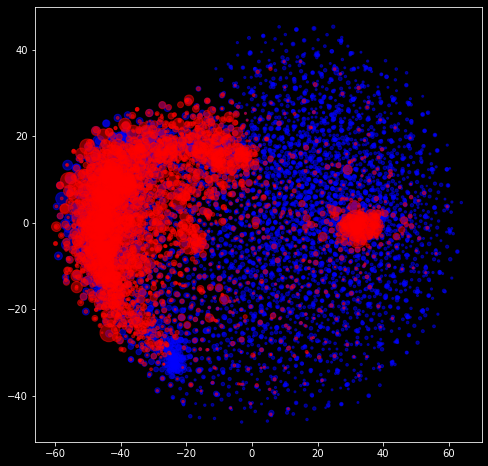

--------------------------------------------------------------------------------
epoch: 16


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.2874187187374573


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.3038082122802734
valid_hitrate: 1008/2447
valid_ndcg: 489.73/2447


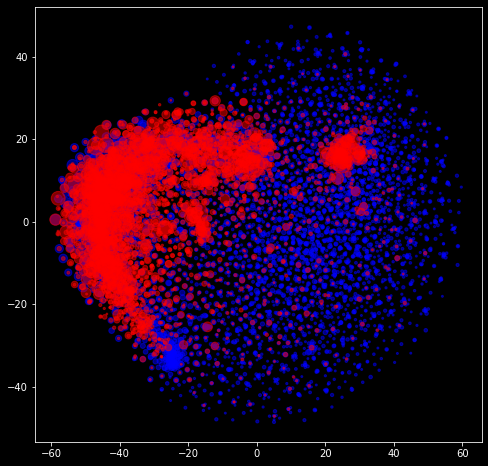

--------------------------------------------------------------------------------
epoch: 17


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.2861709045490044


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.303619384765625
valid_hitrate: 1006/2447
valid_ndcg: 487.17/2447


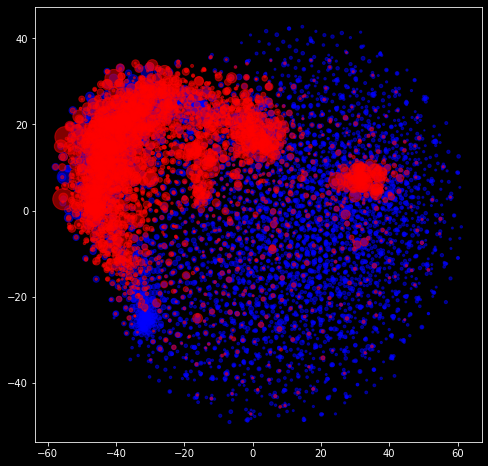

--------------------------------------------------------------------------------
epoch: 18


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.2841347062774977


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.302173614501953
valid_hitrate: 1016/2447
valid_ndcg: 486.09/2447


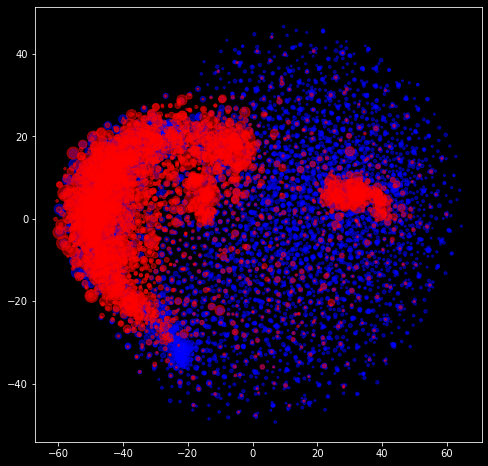

--------------------------------------------------------------------------------
epoch: 19


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.283461000282727


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.302061080932617
valid_hitrate: 1017/2447
valid_ndcg: 495.57/2447


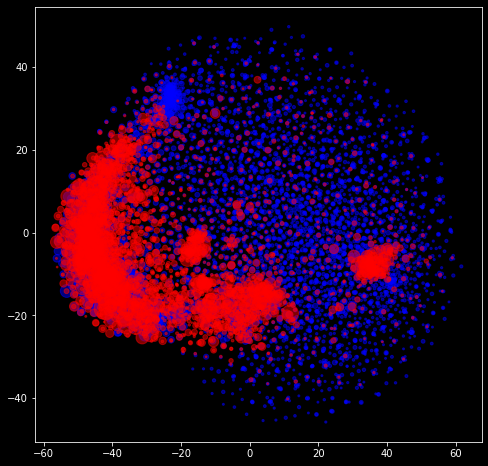

--------------------------------------------------------------------------------
epoch: 20


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.2820364742378914


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.3023064136505127
valid_hitrate: 1006/2447
valid_ndcg: 497.75/2447


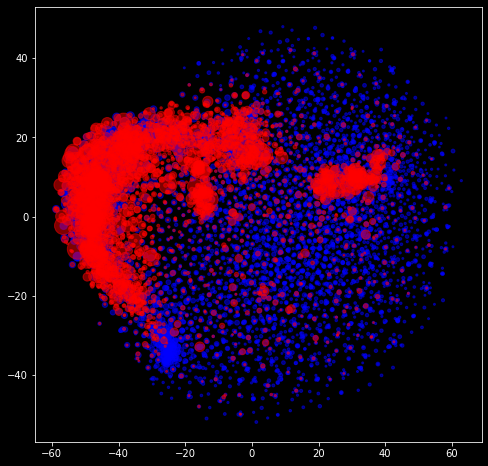

--------------------------------------------------------------------------------
epoch: 21


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.280778326913324


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.30108642578125
valid_hitrate: 1053/2447
valid_ndcg: 509.46/2447


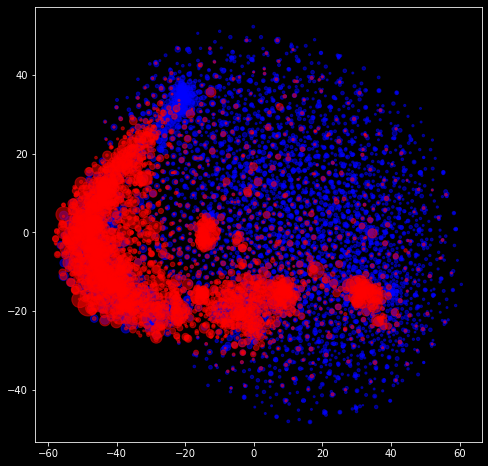

--------------------------------------------------------------------------------
epoch: 22


  0%|          | 0/191 [00:00<?, ?it/s]

train_loss: 2.280537390584097


  0%|          | 0/1 [00:00<?, ?it/s]

valid_loss: 2.3011085987091064
valid_hitrate: 1025/2447
valid_ndcg: 506.31/2447


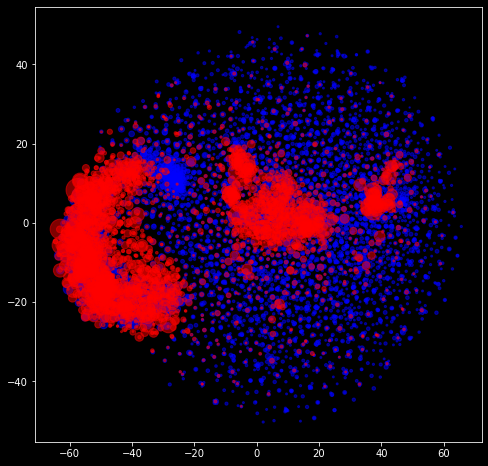

--------------------------------------------------------------------------------
epoch: 23


  0%|          | 0/191 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
hyper_trainer.optimizer = RiemannianAdam(hyper_trainer.model.parameters(), lr=cfg.lr)
hyper_trainer.fit(train_loader, valid_loader, epochs=50, plot=True)
# hyper_trainer.optimizer = RiemannianAdam(hyper_trainer.model.parameters(), lr=1e-3)
# hyper_trainer.fit(train_loader, valid_loader, epochs=40, plot=True)

In [111]:
hyper_trainer.logs['valid_epoch_hitrate'][-1]
hyper_trainer.logs['valid_step_hits'][-1]

1025.0

In [ ]:
'model, embedding_dim, margin, lam, loss, hits, hit_rate, full_hit_rate'

In [123]:
full_hr = full_hit_rate(hyper_trainer, data_train)
row = ','.join(map(str, 
    [
        'HyperCML', 
        cfg.embedding_dim, 
        cfg.margin, 
        cfg.lam, 
        hyper_trainer.logs['valid_epoch_loss'][-1], 
        hyper_trainer.logs['valid_step_hits'][-1], 
        hyper_trainer.logs['valid_epoch_hitrate'][-1],
        full_hr
    ]
))

In [132]:
with open('logs.txt', 'a') as f:
    f.write(row)
    f.write('\n')

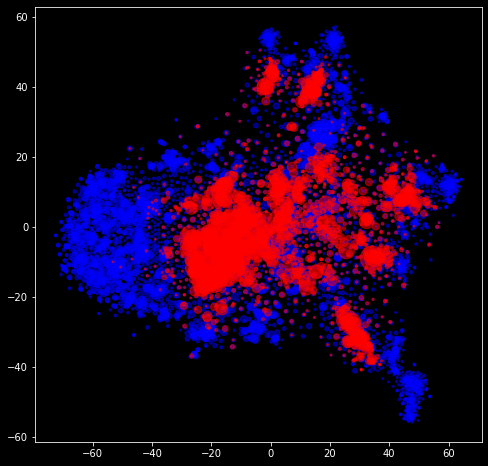

In [69]:
hyper_trainer.plot_embeddings(True)

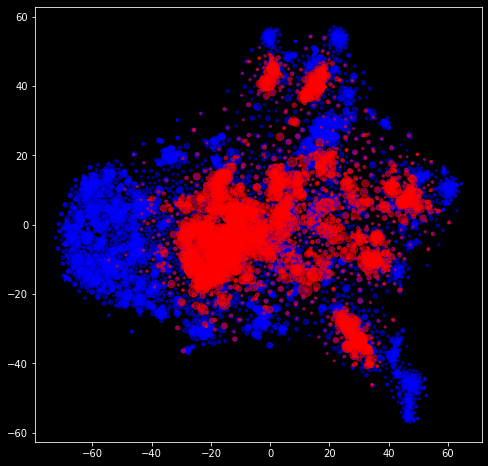

In [70]:
hyper_trainer.plot_embeddings()

In [71]:
full_hit_rate(hyper_trainer, data_train)

0.024519820187985288


## plotting

In [ ]:
hyper_trainer.logs['valid_step_hits']

In [ ]:
plt.plot(hyper_trainer.logs['train_step_loss'])

In [ ]:
metric_tsne = lambda x,y: manifold.dist(torch.tensor(x), torch.tensor(y)).numpy()

In [ ]:
user_emb, item_emb = hyper_trainer.predict_embeddings()
emb = torch.cat([user_emb.cpu(), item_emb.cpu()], dim=0)

from sklearn.manifold import TSNE
tsne_emb = TSNE(metric='euclidean', learning_rate='auto', init='pca', square_distances=True).fit_transform(emb)
tsne_user_emb, tsne_item_emb = tsne_emb[:N_USERS, :], tsne_emb[N_USERS:, :]

In [ ]:
from scipy.interpolate import interp1d
item_mapper = interp1d([item_sizes.min(), item_sizes.max()], [0.04, 0.4])
user_mapper = interp1d([user_sizes.min(), user_sizes.max()], [0.04, 0.4])

In [ ]:
import bokeh.io
import bokeh.plotting
from bokeh.models import ColumnDataSource, HoverTool

source_item = ColumnDataSource(data=dict(
    x=tsne_item_emb[:, 0], 
    y=tsne_item_emb[:, 1], 
    desc=item_data['title'], 
    radius=item_mapper(item_sizes), 
    size=item_sizes))
source_user = ColumnDataSource(data=dict(
    x=tsne_user_emb[:, 0], 
    y=tsne_user_emb[:, 1], 
    desc=user_data['occupation'], 
    radius=user_mapper(user_sizes), 
    size=user_sizes))
hover = HoverTool(tooltips=[
    ('index', '$index'),
    ('desc', '@desc'),
    ('size', '@size')
])

p = bokeh.plotting.figure(tools=[hover])
p.circle('x', 'y', radius='radius', source=source_item, color='blue', alpha=0.5)
p.circle('x', 'y', radius='radius', source=source_user, color='red', alpha=0.5)

#bokeh.io.output_file('test.html')
bokeh.io.output_notebook()
bokeh.io.show(p)

# test

In [19]:
np.linspace(0, 1, 6)

array([0. , 0.2, 0.4, 0.6, 0.8, 1. ])

In [133]:
np.logspace(16, 256

SyntaxError: unexpected EOF while parsing (2051447880.py, line 1)

In [134]:
# lr
[1e-2, 1e-3, 1e-4]
# dim
[16, 64, 256]
# margin
[0.5, 1, 2, 4]
# lam
[0, 0.5, 1]

[0, 0.5, 1]

In [135]:
cfg = dotdict()
cfg['bs'] = 512
cfg['lr'] = 1e-3
cfg['neg_samples'] = 10
cfg['c'] = 1
cfg['embedding_dim'] = 256
cfg['margin'] = 0.5
cfg['lam'] = 1
cfg['reduction'] = 'mean'
cfg['weighted'] = False
cfg['max_norm'] = 5
cfg['drop_rate'] = 0

for neg_samples in [3, 10, 20]:
    cfg['neg_samples'] = neg_samples
    print(cfg)

    manifold = geoopt.PoincareBall(c=cfg.c, learnable=True)
    train_set = PariwiseDataset(
        data_train, 
        N_USERS, 
        N_ITEMS, 
        neg_samples=cfg.neg_samples, 
        weights=(item_sizes if cfg.weighted else None))
    valid_set = PariwiseDataset(data_valid, N_USERS, N_ITEMS, neg_samples=100)
    test_set = PariwiseDataset(data_test, N_USERS, N_ITEMS, neg_samples=100)

    train_loader = DataLoader(train_set, batch_size=cfg.bs, shuffle=True)
    valid_loader = DataLoader(valid_set, batch_size=N_USERS, shuffle=False)
    test_loader = DataLoader(test_set, batch_size=N_USERS, shuffle=False)

    hyper_model = HyperCML(
        N_USERS, 
        N_ITEMS, 
        embedding_dim=cfg.embedding_dim, 
        dropout_rate=cfg.drop_rate,
        manifold=manifold, 
        max_norm=cfg.max_norm)
    hyper_criterion = AdditiveLoss(
        nn.TripletMarginWithDistanceLoss(margin=cfg.margin, distance_function=manifold.dist, reduction=cfg.reduction),
        DistortionLoss(manifold=manifold, reduction=cfg.reduction),
        coefficients=[1, cfg.lam]
    )

    hyper_trainer = MetricTrainer(hyper_model, hyper_criterion)
    hyper_trainer.optimizer = RiemannianAdam(hyper_trainer.model.parameters(), lr=cfg.lr)

    hyper_trainer.fit(train_loader, valid_loader, epochs=10, plot=False)

    print(hyper_trainer.logs['valid_epoch_hitrate'][-1])
    print(full_hit_rate(hyper_trainer, data_train))
    print('*'*80)
    print('*'*80)

{'bs': 512, 'lr': 0.001, 'neg_samples': 3, 'c': 1, 'embedding_dim': 256, 'margin': 0.5, 'lam': 1, 'reduction': 'mean', 'weighted': False, 'max_norm': 5, 'drop_rate': 0}


  0%|          | 0/10 [00:00<?, ?it/s]

epoch: 1


  0%|          | 0/191 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [143]:
101 % 50

1

# ALS

In [1]:
import implicit
implicit.__version__

'0.5.2'

In [2]:
from implicit.als import AlternatingLeastSquares

In [3]:
from scipy.sparse import csr_matrix

csr_data_train = csr_matrix((np.ones(data_train.shape[0]), (data_train.user_id, data_train.item_id)), shape=(N_USERS, N_ITEMS))
valid_ids = data_valid['item_id'].to_numpy()[:, None]
test_ids = data_test['item_id'].to_numpy()[:, None]

NameError: name 'np' is not defined

In [107]:
csr_data_train

<2447x5057 sparse matrix of type '<class 'numpy.float64'>'
	with 97642 stored elements in Compressed Sparse Row format>

In [108]:
model = AlternatingLeastSquares(factors=16, regularization=0, iterations=100, random_state=1)
model.fit(csr_data_train)

  0%|          | 0/100 [00:00<?, ?it/s]

In [114]:
def _hit_rate_util(ids, scores, valid_ids, i, size=100):
    ids_1 = ids[i]
    scores_1 = scores[i]
    valid_id_1 = valid_ids[i][0]
    rated_scores = scores_1[scores_1>-1e+10]
    rated_ids = ids_1[scores_1>-1e+10] # filter already rated
    valid_index = np.where(rated_ids==valid_id_1)[0][0] # save valid one
    valid_id_ = rated_ids[valid_index]
    valid_score_ = rated_scores[valid_index]
    rated_ids_ = rated_ids[np.arange(len(rated_ids))!=valid_index] # remove valid one
    rated_scores_ = rated_scores[np.arange(len(rated_scores))!=valid_index]
    selected_indices = np.random.choice(len(rated_ids_), size=size, replace=False) # chose 100 random
    selected_ids = rated_ids_[selected_indices]
    selected_scores = rated_scores_[selected_indices]
    selected_ids_v = np.append(selected_ids, valid_id_)
    selected_scores_v = np.append(selected_scores, valid_score_)
    return valid_id_ in selected_ids_v[selected_scores_v.argsort()[::-1]][:10]

def hit_rate(ids, scores, valid_ids):
    hits = 0
    for i in range(valid_ids.shape[0]):
        hits += _hit_rate_util(ids, scores, valid_ids, i)
    return hits

In [115]:
ids, scores = model.recommend(np.arange(N_USERS), csr_data_train, N=N_ITEMS, filter_already_liked_items=True)
hits = hit_rate(ids, scores, valid_ids)
print(hits)
print(hits / N_USERS)

934
0.38169186759297097


In [116]:
results_256 = []
for i in np.linspace(-5, 5, num=41):
    reg = 10**i
    print(f'regularization = 10^{i}:')
    model = AlternatingLeastSquares(factors=256, regularization=reg, iterations=100, random_state=1)
    model.fit(csr_data_train)
    ids, scores = model.recommend(np.arange(N_USERS), csr_data_train, N=N_ITEMS, filter_already_liked_items=True)
    hits = hit_rate(ids, scores, valid_ids)
    results_256.append(hits)
    print('hit_rate =', hits / N_USERS)
    print('-'*80)
results_16 = []
for i in np.linspace(-5, 5, num=41):
    reg = 10**i
    print(f'regularization = 10^{i}:')
    model = AlternatingLeastSquares(factors=16, regularization=reg, iterations=100, random_state=1)
    model.fit(csr_data_train)
    ids, scores = model.recommend(np.arange(N_USERS), csr_data_train, N=N_ITEMS, filter_already_liked_items=True)
    hits = hit_rate(ids, scores, valid_ids)
    results_16.append(hits)
    print('hit_rate =', hits / N_USERS)
    print('-'*80)

regularization = 10^-5.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.38659583163056804
--------------------------------------------------------------------------------
regularization = 10^-4.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.38291785860237026
--------------------------------------------------------------------------------
regularization = 10^-4.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3894564773191663
--------------------------------------------------------------------------------
regularization = 10^-4.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3882304863097671
--------------------------------------------------------------------------------
regularization = 10^-4.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3898651409889661
--------------------------------------------------------------------------------
regularization = 10^-3.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.38659583163056804
--------------------------------------------------------------------------------
regularization = 10^-3.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.38291785860237026
--------------------------------------------------------------------------------
regularization = 10^-3.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3878218226399673
--------------------------------------------------------------------------------
regularization = 10^-3.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3861871679607683
--------------------------------------------------------------------------------
regularization = 10^-2.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.38741315897016754
--------------------------------------------------------------------------------
regularization = 10^-2.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3812832039231712
--------------------------------------------------------------------------------
regularization = 10^-2.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3861871679607683
--------------------------------------------------------------------------------
regularization = 10^-2.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3821005312627707
--------------------------------------------------------------------------------
regularization = 10^-1.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.37842255823457294
--------------------------------------------------------------------------------
regularization = 10^-1.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3870044953003678
--------------------------------------------------------------------------------
regularization = 10^-1.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.38863914997956683
--------------------------------------------------------------------------------
regularization = 10^-1.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3861871679607683
--------------------------------------------------------------------------------
regularization = 10^-0.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.38741315897016754
--------------------------------------------------------------------------------
regularization = 10^-0.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3902738046587658
--------------------------------------------------------------------------------
regularization = 10^-0.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.3931344503473641
--------------------------------------------------------------------------------
regularization = 10^0.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.40089906007355947
--------------------------------------------------------------------------------
regularization = 10^0.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4021250510829587
--------------------------------------------------------------------------------
regularization = 10^0.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4143849611769514
--------------------------------------------------------------------------------
regularization = 10^0.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4401307723743359
--------------------------------------------------------------------------------
regularization = 10^1.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4985696771557009
--------------------------------------------------------------------------------
regularization = 10^1.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5243154883530854
--------------------------------------------------------------------------------
regularization = 10^1.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.423375561912546
--------------------------------------------------------------------------------
regularization = 10^1.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4180629342051492
--------------------------------------------------------------------------------
regularization = 10^2.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.42092357989374746
--------------------------------------------------------------------------------
regularization = 10^2.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.18471597874948917
--------------------------------------------------------------------------------
regularization = 10^2.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.0939926440539436
--------------------------------------------------------------------------------
regularization = 10^2.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.21822639967306906
--------------------------------------------------------------------------------
regularization = 10^3.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.03677973028197793
--------------------------------------------------------------------------------
regularization = 10^3.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.22353902738046588
--------------------------------------------------------------------------------
regularization = 10^3.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.34777278299959136
--------------------------------------------------------------------------------
regularization = 10^3.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.37556191254597465
--------------------------------------------------------------------------------
regularization = 10^4.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.09562729873314263
--------------------------------------------------------------------------------
regularization = 10^4.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.41969758888434816
--------------------------------------------------------------------------------
regularization = 10^4.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4139762975071516
--------------------------------------------------------------------------------
regularization = 10^4.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.21536575398447078
--------------------------------------------------------------------------------
regularization = 10^5.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.07151614221495708
--------------------------------------------------------------------------------
regularization = 10^-5.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5063342868818962
--------------------------------------------------------------------------------
regularization = 10^-4.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5059256232120964
--------------------------------------------------------------------------------
regularization = 10^-4.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5063342868818962
--------------------------------------------------------------------------------
regularization = 10^-4.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5046996322026972
--------------------------------------------------------------------------------
regularization = 10^-4.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5042909685328975
--------------------------------------------------------------------------------
regularization = 10^-3.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5128729055986923
--------------------------------------------------------------------------------
regularization = 10^-3.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5075602778912954
--------------------------------------------------------------------------------
regularization = 10^-3.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.503473641193298
--------------------------------------------------------------------------------
regularization = 10^-3.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5055169595422967
--------------------------------------------------------------------------------
regularization = 10^-2.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5096035962402943
--------------------------------------------------------------------------------
regularization = 10^-2.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5087862689006948
--------------------------------------------------------------------------------
regularization = 10^-2.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.505108295872497
--------------------------------------------------------------------------------
regularization = 10^-2.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5022476501838986
--------------------------------------------------------------------------------
regularization = 10^-1.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.49775234981610134
--------------------------------------------------------------------------------
regularization = 10^-1.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5108295872496935
--------------------------------------------------------------------------------
regularization = 10^-1.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5055169595422967
--------------------------------------------------------------------------------
regularization = 10^-1.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4993870044953004
--------------------------------------------------------------------------------
regularization = 10^-0.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5079689415610952
--------------------------------------------------------------------------------
regularization = 10^-0.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5096035962402943
--------------------------------------------------------------------------------
regularization = 10^-0.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5108295872496935
--------------------------------------------------------------------------------
regularization = 10^0.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5128729055986923
--------------------------------------------------------------------------------
regularization = 10^0.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5010216591744994
--------------------------------------------------------------------------------
regularization = 10^0.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5091949325704945
--------------------------------------------------------------------------------
regularization = 10^0.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5153248876174908
--------------------------------------------------------------------------------
regularization = 10^1.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.5234981610134859
--------------------------------------------------------------------------------
regularization = 10^1.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.513281569268492
--------------------------------------------------------------------------------
regularization = 10^1.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.423375561912546
--------------------------------------------------------------------------------
regularization = 10^1.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.41888026154474867
--------------------------------------------------------------------------------
regularization = 10^2.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.423375561912546
--------------------------------------------------------------------------------
regularization = 10^2.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.16714344094809971
--------------------------------------------------------------------------------
regularization = 10^2.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.13240702901512055
--------------------------------------------------------------------------------
regularization = 10^2.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.039640375970576215
--------------------------------------------------------------------------------
regularization = 10^3.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.09113199836534532
--------------------------------------------------------------------------------
regularization = 10^3.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.03473641193297916
--------------------------------------------------------------------------------
regularization = 10^3.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4205149162239477
--------------------------------------------------------------------------------
regularization = 10^3.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.03637106661217818
--------------------------------------------------------------------------------
regularization = 10^4.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.2921945239068247
--------------------------------------------------------------------------------
regularization = 10^4.25:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4241928892521455
--------------------------------------------------------------------------------
regularization = 10^4.5:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.4176542705353494
--------------------------------------------------------------------------------
regularization = 10^4.75:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.0641601961585615
--------------------------------------------------------------------------------
regularization = 10^5.0:


  0%|          | 0/100 [00:00<?, ?it/s]

hit_rate = 0.18226399673069063
--------------------------------------------------------------------------------


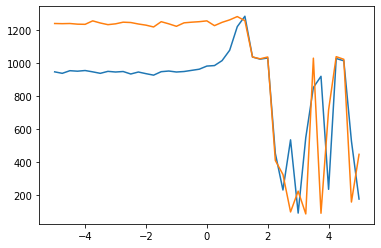

In [117]:
plt.plot(np.linspace(-5, 5, num=41), np.array(results_256))
plt.plot(np.linspace(-5, 5, num=41), np.array(results_16))